<a href="https://colab.research.google.com/github/efrat-dev/insider-threat-detector/blob/main/23.6_eda_on_new_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# =============================================================================
# COMPREHENSIVE EDA FOR INSIDER THREAT DATASET
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from datetime import datetime
from scipy import stats
from scipy.stats import chi2_contingency
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# =============================================================================
# STEP 1: DATA LOADING AND BASIC OVERVIEW
# =============================================================================

"""
Purpose: Load the dataset and get basic understanding of data structure,
size, and quality. This includes checking data types, missing values,
and basic statistics.
"""

# Load the dataset
df = pd.read_csv('insider_threat_data.csv')  # Replace with your file path

# Basic dataset information
print("=== DATASET BASIC INFORMATION ===")
print(f"Dataset shape: {df.shape}")
print(f"Number of unique employees: {df['employee_id'].nunique()}")
print(f"Date range: {df['date'].min()} to {df['date'].max()}")
print(f"Total days in dataset: {(pd.to_datetime(df['date'].max()) - pd.to_datetime(df['date'].min())).days}")
print(f"Malicious employees: {df['is_malicious'].sum()} ({df['is_malicious'].mean()*100:.2f}%)")

# Data types overview
print("\n=== DATA TYPES ===")
print(df.dtypes)

# Missing values analysis
print("\n=== MISSING VALUES ANALYSIS ===")
missing_data = df.isnull().sum()
missing_percentage = (missing_data / len(df)) * 100
missing_df = pd.DataFrame({
    'Missing_Count': missing_data,
    'Missing_Percentage': missing_percentage
}).sort_values('Missing_Percentage', ascending=False)
print(missing_df[missing_df['Missing_Count'] > 0])

# Basic statistics for numerical columns
print("\n=== BASIC STATISTICS (NUMERICAL COLUMNS) ===")
numerical_cols = df.select_dtypes(include=[np.number]).columns
print(df[numerical_cols].describe())



=== DATASET BASIC INFORMATION ===
Dataset shape: (180000, 56)
Number of unique employees: 1000
Date range: 2024-12-24 00:00:00 to 2025-06-21 00:00:00
Total days in dataset: 179
Malicious employees: 9000 (5.00%)

=== DATA TYPES ===
employee_id                             object
date                            datetime64[ns]
employee_department                     object
employee_campus                         object
employee_position                       object
employee_seniority_years                 int64
is_contractor                            int64
employee_classification                  int64
has_foreign_citizenship                  int64
has_criminal_record                      int64
has_medical_history                      int64
employee_origin_country                 object
behavioral_group                        object
is_malicious                             int64
risk_travel_indicator                    int64
num_print_commands                       int64
total_printed_pag

In [ ]:
# =============================================================================
# STEP 2: DATA PREPROCESSING AND CLEANING
# =============================================================================

"""
Purpose: Clean the data, handle missing values, convert data types, and prepare
derived features for analysis. This step ensures data quality for subsequent analysis.
"""

# Convert date column to datetime
df['date'] = pd.to_datetime(df['date'])

# Create derived time features
df['day_of_week'] = df['date'].dt.dayofweek  # 0=Monday, 6=Sunday
df['day_name'] = df['date'].dt.day_name()
df['month'] = df['date'].dt.month
df['week_of_year'] = df['date'].dt.isocalendar().week

# Handle missing values based on business logic
# For numerical columns, consider using median/mean or domain-specific imputation
# For categorical columns, consider mode or creating 'Unknown' category

# Example of handling missing values (adjust based on your data)
for col in df.columns:
    if df[col].dtype == 'object':
        df[col] = df[col].fillna('Unknown')
    elif df[col].dtype in ['int64', 'float64']:
        df[col] = df[col].fillna(df[col].median())

# Create additional derived features
df['is_weekend'] = df['day_of_week'].isin([5, 6])
df['total_print_activity'] = df['num_print_commands'] + df['num_print_commands_off_hours']
df['total_burn_activity'] = df['num_burn_requests'] + df['num_burn_requests_off_hours']
df['building_access_ratio'] = df['num_exits'] / (df['num_entries'] + 1)  # +1 to avoid division by zero

print("=== DATA PREPROCESSING COMPLETED ===")
print(f"Final dataset shape: {df.shape}")


=== DATA PREPROCESSING COMPLETED ===
Final dataset shape: (180000, 56)


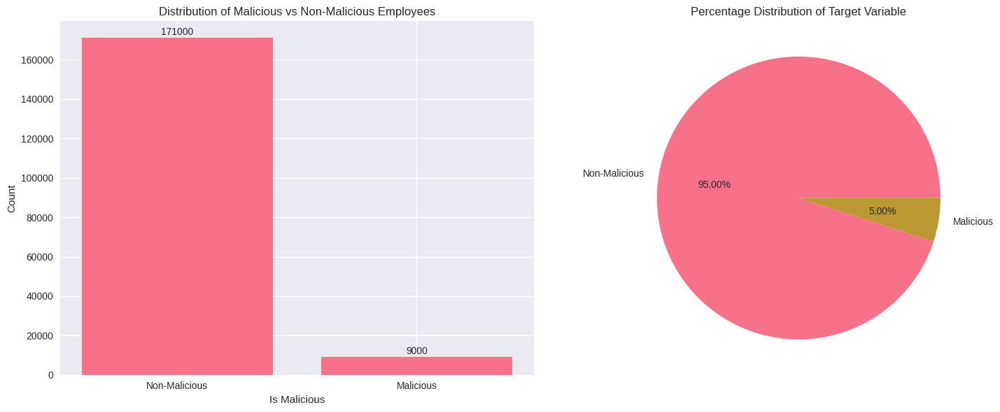


Class Imbalance Ratio (Non-Malicious:Malicious): 19.00:1


In [ ]:
# =============================================================================
# STEP 3: TARGET VARIABLE ANALYSIS
# =============================================================================

"""
Purpose: Analyze the distribution of the target variable (is_malicious) and
understand the class imbalance. This is crucial for understanding the
baseline performance and choosing appropriate modeling strategies.
"""

# Target variable distribution
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Absolute counts
target_counts = df['is_malicious'].value_counts()
axes[0].bar(target_counts.index, target_counts.values)
axes[0].set_title('Distribution of Malicious vs Non-Malicious Employees')
axes[0].set_xlabel('Is Malicious')
axes[0].set_ylabel('Count')
axes[0].set_xticks([0, 1])
axes[0].set_xticklabels(['Non-Malicious', 'Malicious'])

# Add value labels on bars
for i, v in enumerate(target_counts.values):
    axes[0].text(i, v + 0.01*max(target_counts.values), str(v), ha='center')

# Percentage distribution
target_pct = df['is_malicious'].value_counts(normalize=True) * 100
axes[1].pie(target_pct.values, labels=['Non-Malicious', 'Malicious'], autopct='%1.2f%%')
axes[1].set_title('Percentage Distribution of Target Variable')

plt.tight_layout()
plt.show()

# Class imbalance ratio
imbalance_ratio = target_counts[0] / target_counts[1] if target_counts[1] > 0 else float('inf')
print(f"\nClass Imbalance Ratio (Non-Malicious:Malicious): {imbalance_ratio:.2f}:1")


=== ANALYSIS OF EMPLOYEE_DEPARTMENT ===
Number of unique values: 11
Top 10 values:
employee_department
R&D Department                        40680
Engineering Department                38160
Operations and Manufacturing          25380
Information Technology                23220
Marketing and Business Development    18000
Project Management                    13320
Finance                                8100
Security and Information Security      5400
Human Resources                        5220
Legal and Regulation                   1620
Name: count, dtype: int64

Malicious rate by employee_department:
                   employee_department  total_count  malicious_count  \
3                      Human Resources         5220              720   
6   Marketing and Business Development        18000             1080   
4               Information Technology        23220             1260   
9                       R&D Department        40680             2160   
0               Engineering De

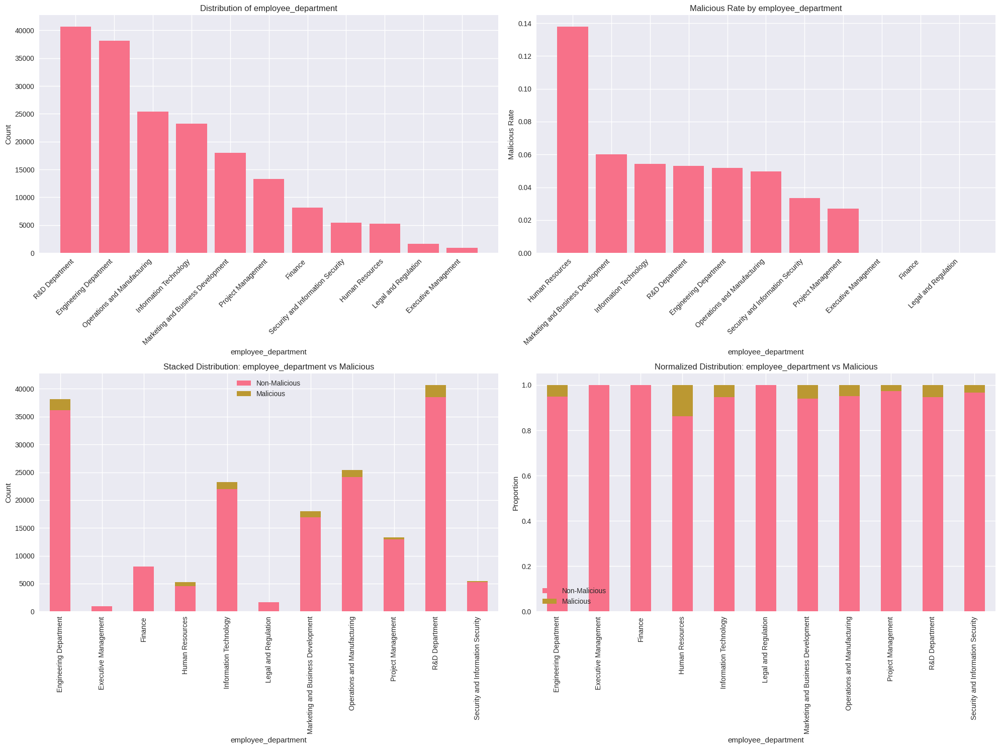


Chi-square test results:
Chi-square statistic: 1646.1363
P-value: 0.0000
Degrees of freedom: 10
Significant association: Yes

=== ANALYSIS OF EMPLOYEE_CAMPUS ===
Number of unique values: 3
Top 10 values:
employee_campus
Campus C    62100
Campus A    59220
Campus B    58680
Name: count, dtype: int64

Malicious rate by employee_campus:
  employee_campus  total_count  malicious_count  malicious_rate
0        Campus A        59220             3240        0.054711
2        Campus C        62100             3060        0.049275
1        Campus B        58680             2700        0.046012


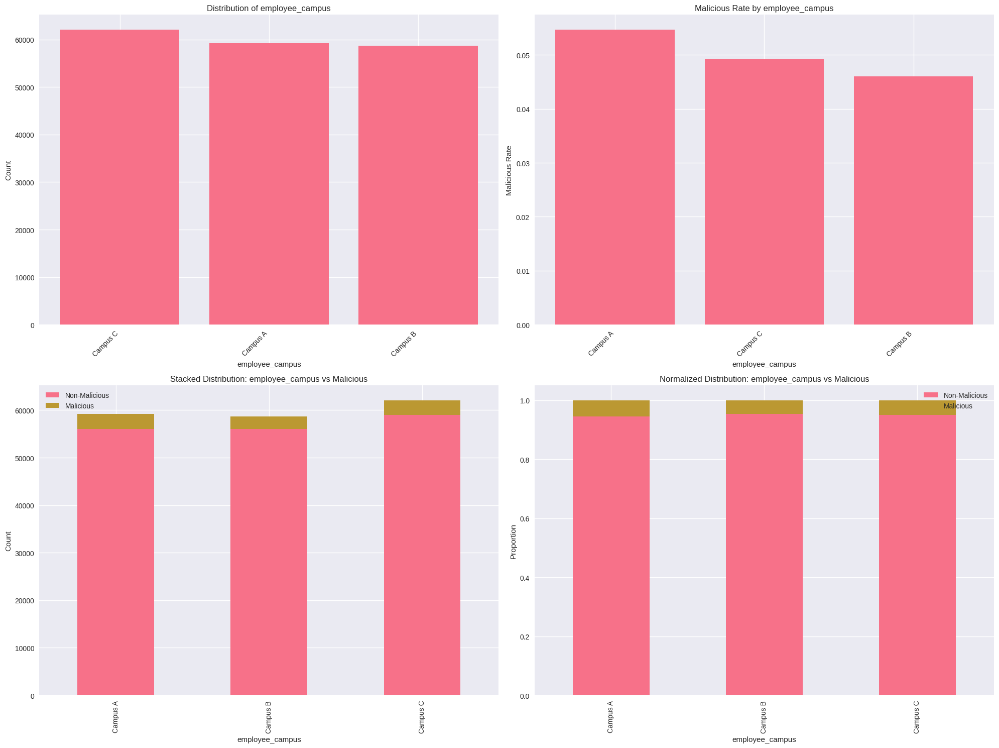


Chi-square test results:
Chi-square statistic: 48.0037
P-value: 0.0000
Degrees of freedom: 2
Significant association: Yes

=== ANALYSIS OF EMPLOYEE_POSITION ===
Number of unique values: 46
Top 10 values:
employee_position
Secretary                                                  31140
Systems Engineer                                           13680
Head of R&D                                                 8460
Test Engineer                                               7560
Integration and Testing Engineer                            6480
Algorithm Engineer                                          6300
Process Engineer                                            6120
Development Engineer (Hardware / Software / Mechanical)     5760
Design Engineer                                             5580
Head of Engineering                                         5220
Name: count, dtype: int64

Malicious rate by employee_position:
                                 employee_position  total_count

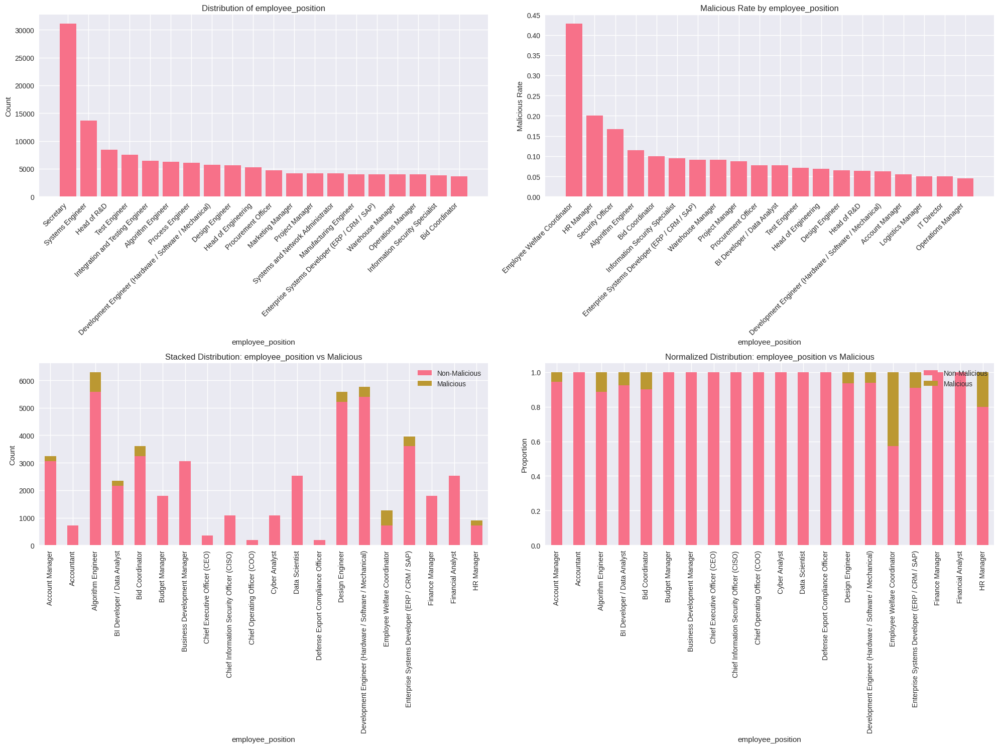


Chi-square test results:
Chi-square statistic: 8373.1617
P-value: 0.0000
Degrees of freedom: 45
Significant association: Yes

=== ANALYSIS OF IS_CONTRACTOR ===
Number of unique values: 2
Top 10 values:
is_contractor
0    153900
1     26100
Name: count, dtype: int64

Malicious rate by is_contractor:
   is_contractor  total_count  malicious_count  malicious_rate
0              0       153900             7740        0.050292
1              1        26100             1260        0.048276


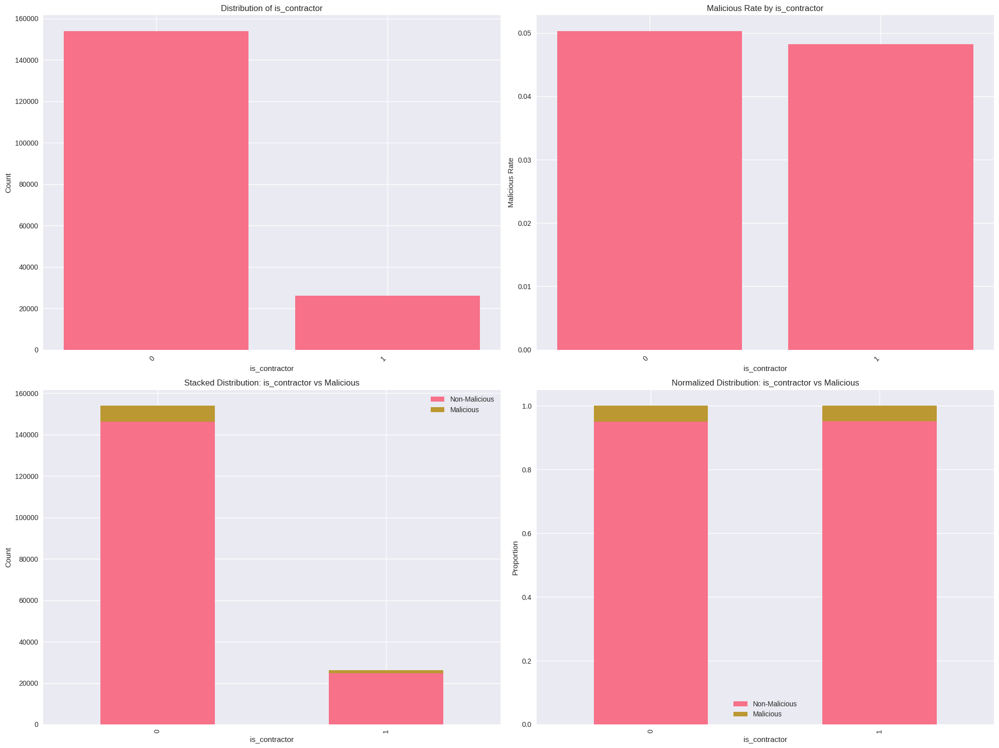


Chi-square test results:
Chi-square statistic: 1.8682
P-value: 0.1717
Degrees of freedom: 1
Significant association: No

=== ANALYSIS OF EMPLOYEE_CLASSIFICATION ===
Number of unique values: 4
Top 10 values:
employee_classification
2    81180
3    49680
1    46260
4     2880
Name: count, dtype: int64

Malicious rate by employee_classification:
   employee_classification  total_count  malicious_count  malicious_rate
3                        4         2880              180        0.062500
2                        3        49680             2700        0.054348
1                        2        81180             3960        0.048780
0                        1        46260             2160        0.046693


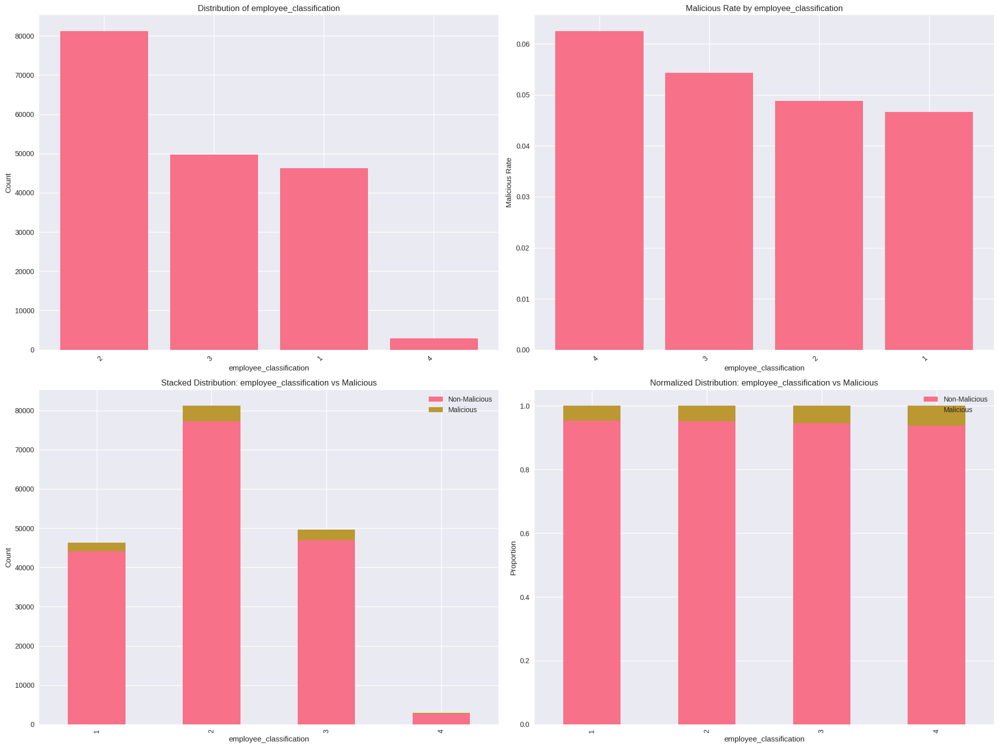


Chi-square test results:
Chi-square statistic: 42.4399
P-value: 0.0000
Degrees of freedom: 3
Significant association: Yes

=== ANALYSIS OF HAS_FOREIGN_CITIZENSHIP ===
Number of unique values: 2
Top 10 values:
has_foreign_citizenship
0    151200
1     28800
Name: count, dtype: int64

Malicious rate by has_foreign_citizenship:
   has_foreign_citizenship  total_count  malicious_count  malicious_rate
0                        0       151200             7740         0.05119
1                        1        28800             1260         0.04375


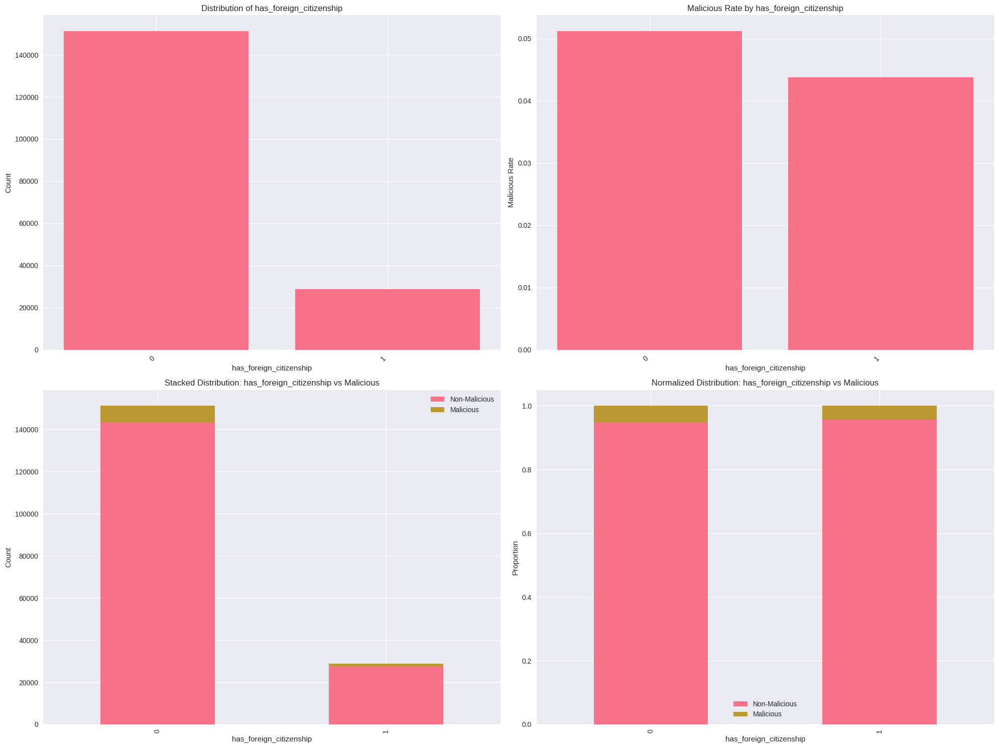


Chi-square test results:
Chi-square statistic: 28.0391
P-value: 0.0000
Degrees of freedom: 1
Significant association: Yes

=== ANALYSIS OF HAS_CRIMINAL_RECORD ===
Number of unique values: 2
Top 10 values:
has_criminal_record
0    171540
1      8460
Name: count, dtype: int64

Malicious rate by has_criminal_record:
   has_criminal_record  total_count  malicious_count  malicious_rate
1                    1         8460              720        0.085106
0                    0       171540             8280        0.048269


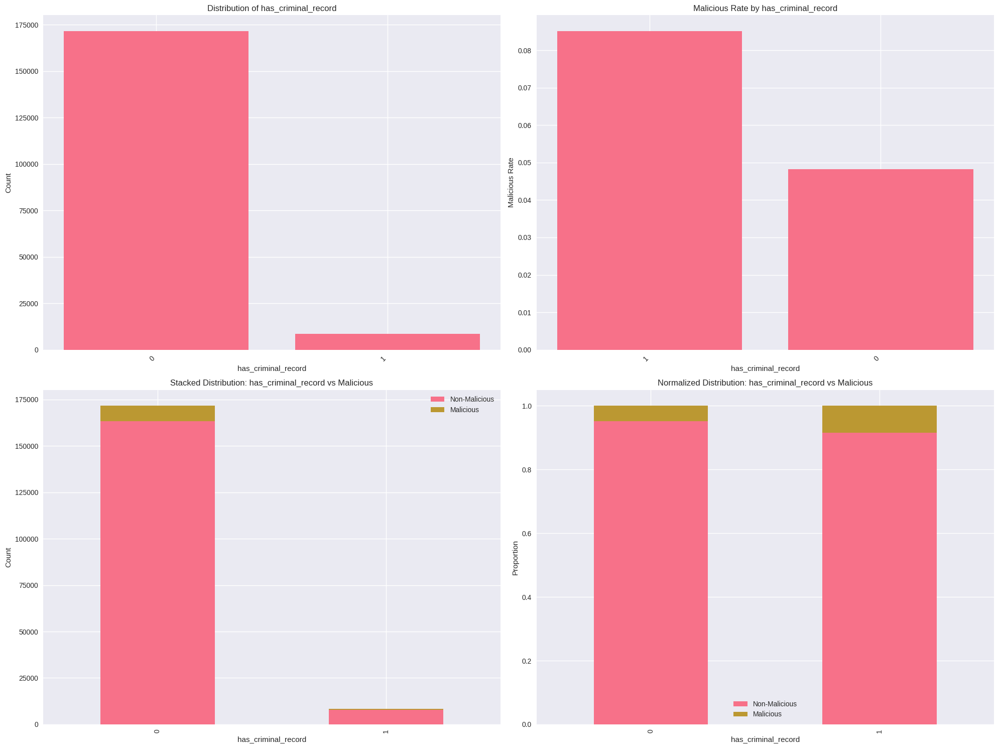


Chi-square test results:
Chi-square statistic: 229.5580
P-value: 0.0000
Degrees of freedom: 1
Significant association: Yes

=== ANALYSIS OF HAS_MEDICAL_HISTORY ===
Number of unique values: 2
Top 10 values:
has_medical_history
0    149940
1     30060
Name: count, dtype: int64

Malicious rate by has_medical_history:
   has_medical_history  total_count  malicious_count  malicious_rate
0                    0       149940             7740        0.051621
1                    1        30060             1260        0.041916


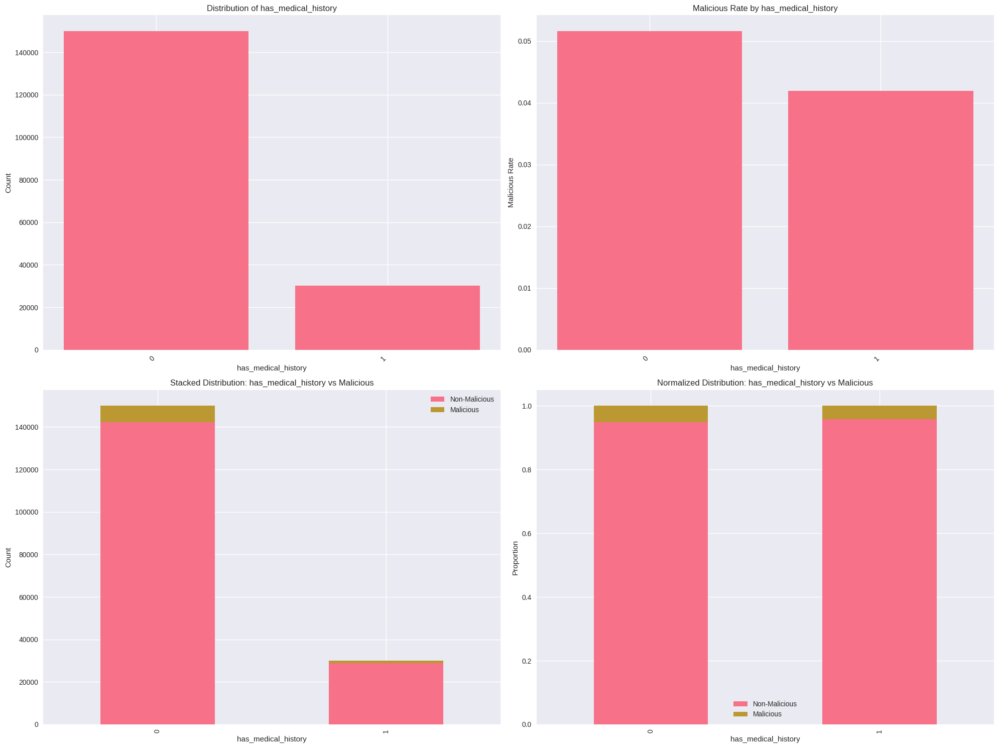


Chi-square test results:
Chi-square statistic: 49.4420
P-value: 0.0000
Degrees of freedom: 1
Significant association: Yes

=== ANALYSIS OF EMPLOYEE_ORIGIN_COUNTRY ===
Number of unique values: 11
Top 10 values:
employee_origin_country
Germany      37260
France       27180
Other        25200
UK           19980
Canada       19260
Australia    15840
Israel        9000
China         9000
India         6840
USA           6120
Name: count, dtype: int64

Malicious rate by employee_origin_country:
   employee_origin_country  total_count  malicious_count  malicious_rate
5                    India         6840              540        0.078947
7                    Other        25200             1800        0.071429
1                   Canada        19260             1260        0.065421
9                       UK        19980             1260        0.063063
2                    China         9000              540        0.060000
4                  Germany        37260             1800        0.0

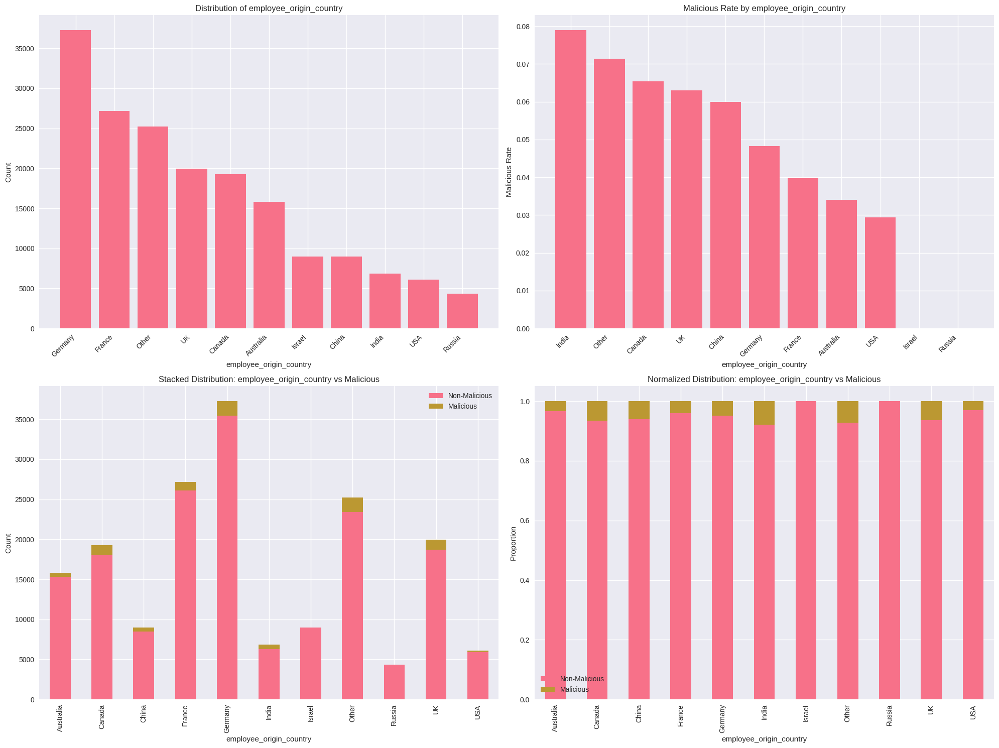


Chi-square test results:
Chi-square statistic: 1454.0213
P-value: 0.0000
Degrees of freedom: 10
Significant association: Yes

=== ANALYSIS OF BEHAVIORAL_GROUP ===
Number of unique values: 6
Top 10 values:
behavioral_group
B    78840
C    53640
F    23220
D    18000
E     5400
A      900
Name: count, dtype: int64

Malicious rate by behavioral_group:
  behavioral_group  total_count  malicious_count  malicious_rate
3                D        18000             1080        0.060000
5                F        23220             1260        0.054264
1                B        78840             4140        0.052511
2                C        53640             2340        0.043624
4                E         5400              180        0.033333
0                A          900                0        0.000000


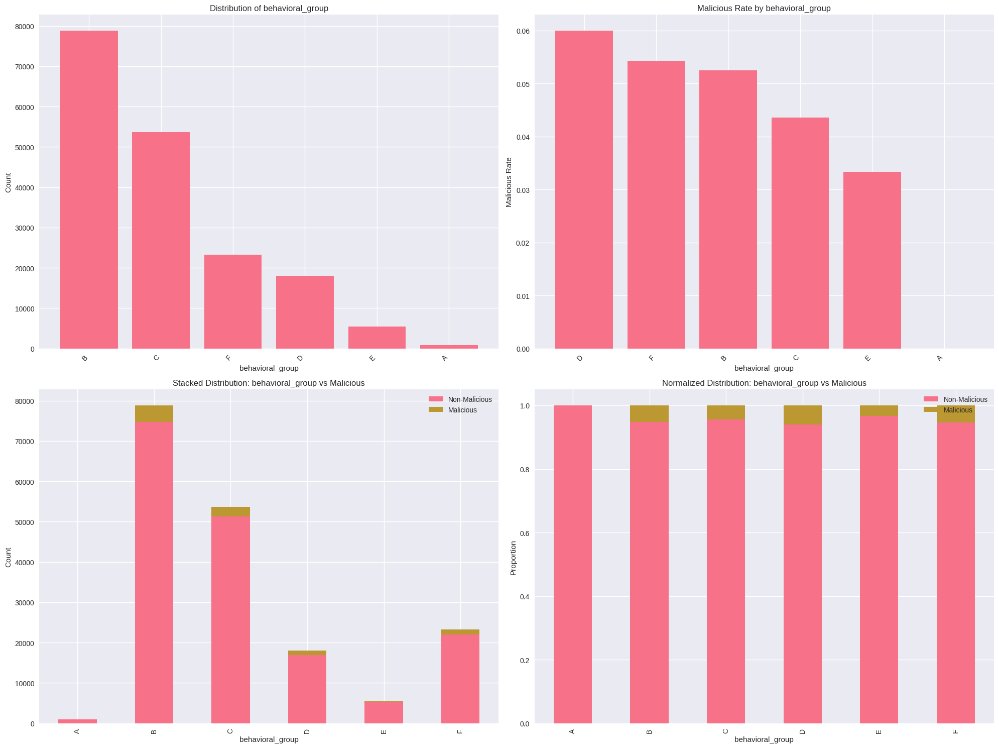


Chi-square test results:
Chi-square statistic: 182.1030
P-value: 0.0000
Degrees of freedom: 5
Significant association: Yes


In [ ]:
# =============================================================================
# STEP 4: CATEGORICAL VARIABLES ANALYSIS
# =============================================================================

"""
Purpose: Analyze categorical variables to understand their distributions and
relationship with the target variable. This helps identify potential risk factors
and patterns in different employee segments.
"""

categorical_cols = ['employee_department', 'employee_campus', 'employee_position',
                   'is_contractor', 'employee_classification', 'has_foreign_citizenship',
                   'has_criminal_record', 'has_medical_history', 'employee_origin_country',
                   'behavioral_group']

# Function to analyze categorical variables
def analyze_categorical_variable(col_name, df, max_categories=20):
    """
    Analyze a categorical variable and its relationship with the target variable
    """
    print(f"\n=== ANALYSIS OF {col_name.upper()} ===")

    # Basic distribution
    value_counts = df[col_name].value_counts()
    print(f"Number of unique values: {len(value_counts)}")
    print(f"Top 10 values:\n{value_counts.head(10)}")

    # Malicious rate by category
    malicious_rate = df.groupby(col_name)['is_malicious'].agg(['count', 'sum', 'mean']).reset_index()
    malicious_rate.columns = [col_name, 'total_count', 'malicious_count', 'malicious_rate']
    malicious_rate = malicious_rate.sort_values('malicious_rate', ascending=False)

    print(f"\nMalicious rate by {col_name}:")
    print(malicious_rate.head(10))

    # Visualization
    fig, axes = plt.subplots(2, 2, figsize=(20, 15))

    # Distribution of categories
    top_categories = value_counts.head(max_categories)
    axes[0,0].bar(range(len(top_categories)), top_categories.values)
    axes[0,0].set_title(f'Distribution of {col_name}')
    axes[0,0].set_xlabel(col_name)
    axes[0,0].set_ylabel('Count')
    axes[0,0].set_xticks(range(len(top_categories)))
    axes[0,0].set_xticklabels(top_categories.index, rotation=45, ha='right')

    # Malicious rate by category
    top_malicious_rate = malicious_rate.head(max_categories)
    axes[0,1].bar(range(len(top_malicious_rate)), top_malicious_rate['malicious_rate'])
    axes[0,1].set_title(f'Malicious Rate by {col_name}')
    axes[0,1].set_xlabel(col_name)
    axes[0,1].set_ylabel('Malicious Rate')
    axes[0,1].set_xticks(range(len(top_malicious_rate)))
    axes[0,1].set_xticklabels(top_malicious_rate[col_name], rotation=45, ha='right')

    # Stacked bar chart
    stacked_data = df.groupby([col_name, 'is_malicious']).size().unstack(fill_value=0)
    stacked_data_top = stacked_data.head(max_categories)
    stacked_data_top.plot(kind='bar', stacked=True, ax=axes[1,0])
    axes[1,0].set_title(f'Stacked Distribution: {col_name} vs Malicious')
    axes[1,0].set_xlabel(col_name)
    axes[1,0].set_ylabel('Count')
    axes[1,0].legend(['Non-Malicious', 'Malicious'])

    # Normalized stacked bar chart
    stacked_data_norm = stacked_data.div(stacked_data.sum(axis=1), axis=0).head(max_categories)
    stacked_data_norm.plot(kind='bar', stacked=True, ax=axes[1,1])
    axes[1,1].set_title(f'Normalized Distribution: {col_name} vs Malicious')
    axes[1,1].set_xlabel(col_name)
    axes[1,1].set_ylabel('Proportion')
    axes[1,1].legend(['Non-Malicious', 'Malicious'])

    plt.tight_layout()
    plt.show()

    # Statistical test (Chi-square test)
    if len(value_counts) > 1:
        contingency_table = pd.crosstab(df[col_name], df['is_malicious'])
        chi2, p_value, dof, expected = chi2_contingency(contingency_table)
        print(f"\nChi-square test results:")
        print(f"Chi-square statistic: {chi2:.4f}")
        print(f"P-value: {p_value:.4f}")
        print(f"Degrees of freedom: {dof}")
        print(f"Significant association: {'Yes' if p_value < 0.05 else 'No'}")

    return malicious_rate

# Analyze each categorical variable
categorical_analysis_results = {}
for col in categorical_cols:
    if col in df.columns:
        categorical_analysis_results[col] = analyze_categorical_variable(col, df)

In [ ]:
# =============================================================================
# STEP 5: NUMERICAL VARIABLES ANALYSIS (FIXED)
# =============================================================================

"""
Purpose: Analyze numerical variables to understand their distributions,
identify outliers, and examine their relationship with the target variable.
This helps identify behavioral patterns that distinguish malicious from non-malicious employees.
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Define numerical columns by category
employee_characteristics = ['employee_seniority_years']
print_activity_cols = ['num_print_commands', 'total_printed_pages', 'num_print_commands_off_hours',
                      'num_printed_pages_off_hours', 'num_color_prints', 'num_bw_prints',
                      'ratio_color_prints', 'printed_from_other', 'print_campuses']
burn_activity_cols = ['num_burn_requests', 'max_request_classification', 'avg_request_classification',
                     'num_burn_requests_off_hours', 'total_burn_volume_mb', 'total_files_burned',
                     'burned_from_other', 'burn_campuses']
travel_cols = ['trip_day_number']
building_access_cols = ['num_entries', 'num_exits', 'total_presence_minutes',
                       'entered_during_night_hours', 'num_unique_campus']

# Function to check if a column is truly numerical
def is_truly_numerical(df, col_name):
    """
    Check if a column contains truly numerical data (not strings or mixed types)
    """
    try:
        # Try to convert to numeric, coercing errors to NaN
        numeric_series = pd.to_numeric(df[col_name], errors='coerce')
        # Check if we have any non-null numeric values
        return numeric_series.notna().any()
    except:
        return False

# Function to convert time strings to numerical format (minutes from midnight)
def convert_time_to_minutes(time_str):
    """
    Convert time string (HH:MM) to minutes from midnight
    Returns NaN for 'Unknown' or invalid formats
    """
    if pd.isna(time_str) or time_str == 'Unknown' or not isinstance(time_str, str):
        return np.nan

    try:
        # Handle format like "08:30"
        if ':' in time_str:
            hours, minutes = time_str.split(':')
            return int(hours) * 60 + int(minutes)
        else:
            return np.nan
    except:
        return np.nan

# Function to preprocess time columns
def preprocess_time_columns(df, time_cols):
    """
    Convert time columns to numerical format
    """
    df_processed = df.copy()

    for col in time_cols:
        if col in df_processed.columns:
            print(f"Converting {col} to numerical format...")
            df_processed[f'{col}_minutes'] = df_processed[col].apply(convert_time_to_minutes)
            print(f"  Original unique values sample: {df_processed[col].unique()[:10]}")
            print(f"  Converted values range: {df_processed[f'{col}_minutes'].min():.0f} - {df_processed[f'{col}_minutes'].max():.0f} minutes")

    return df_processed

# Function to analyze numerical variables
def analyze_numerical_variable(col_name, df):
    """
    Comprehensive analysis of a numerical variable
    """
    print(f"\n=== ANALYSIS OF {col_name.upper()} ===")

    # Check if column is truly numerical
    if not is_truly_numerical(df, col_name):
        print(f"ERROR: {col_name} contains non-numerical data. Skipping analysis.")
        print(f"Sample values: {df[col_name].head(10).tolist()}")
        print(f"Data types in column: {df[col_name].apply(type).value_counts()}")
        return

    # Convert to numeric, handling any remaining non-numeric values
    col_data = pd.to_numeric(df[col_name], errors='coerce').dropna()

    if len(col_data) == 0:
        print(f"No valid numerical data found in {col_name}")
        return

    print(f"Basic Statistics:")
    print(f"Count: {len(col_data)}")
    print(f"Mean: {col_data.mean():.4f}")
    print(f"Median: {col_data.median():.4f}")
    print(f"Std: {col_data.std():.4f}")
    print(f"Min: {col_data.min():.4f}")
    print(f"Max: {col_data.max():.4f}")
    print(f"Skewness: {col_data.skew():.4f}")
    print(f"Kurtosis: {col_data.kurtosis():.4f}")

    # Outlier detection using IQR method
    Q1 = col_data.quantile(0.25)
    Q3 = col_data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = col_data[(col_data < lower_bound) | (col_data > upper_bound)]
    print(f"Outliers (IQR method): {len(outliers)} ({len(outliers)/len(col_data)*100:.2f}%)")

    # Comparison between malicious and non-malicious employees
    # First ensure we have the target column and it's aligned with our data
    valid_indices = col_data.index
    if 'is_malicious' in df.columns:
        # Create a filtered dataframe with only valid indices
        df_filtered = df.loc[valid_indices]
        malicious_mask = df_filtered['is_malicious'] == 1
        non_malicious_mask = df_filtered['is_malicious'] == 0

        malicious_data = pd.to_numeric(df_filtered.loc[malicious_mask, col_name], errors='coerce').dropna()
        non_malicious_data = pd.to_numeric(df_filtered.loc[non_malicious_mask, col_name], errors='coerce').dropna()

        print(f"\nComparison between groups:")
        print(f"Non-malicious - Count: {len(non_malicious_data)}, Mean: {non_malicious_data.mean():.4f}, Median: {non_malicious_data.median():.4f}")
        print(f"Malicious - Count: {len(malicious_data)}, Mean: {malicious_data.mean():.4f}, Median: {malicious_data.median():.4f}")

        # Statistical test (Mann-Whitney U test for non-parametric comparison)
        if len(malicious_data) > 0 and len(non_malicious_data) > 0:
            try:
                statistic, p_value = stats.mannwhitneyu(malicious_data, non_malicious_data, alternative='two-sided')
                print(f"Mann-Whitney U test p-value: {p_value:.4f}")
                print(f"Significant difference: {'Yes' if p_value < 0.05 else 'No'}")

                # Effect size (Cohen's d)
                pooled_std = np.sqrt(((len(malicious_data) - 1) * malicious_data.var() +
                                     (len(non_malicious_data) - 1) * non_malicious_data.var()) /
                                    (len(malicious_data) + len(non_malicious_data) - 2))
                if pooled_std > 0:
                    cohens_d = (malicious_data.mean() - non_malicious_data.mean()) / pooled_std
                    print(f"Cohen's d (effect size): {cohens_d:.4f}")
            except Exception as e:
                print(f"Could not perform statistical test: {e}")
    else:
        print("Target variable 'is_malicious' not found")
        malicious_data = pd.Series([])
        non_malicious_data = pd.Series([])

    # Visualization
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))

    # Histogram
    axes[0,0].hist(col_data, bins=min(50, len(col_data.unique())), alpha=0.7, edgecolor='black')
    axes[0,0].set_title(f'Distribution of {col_name}')
    axes[0,0].set_xlabel(col_name)
    axes[0,0].set_ylabel('Frequency')
    axes[0,0].axvline(col_data.mean(), color='red', linestyle='--', label=f'Mean: {col_data.mean():.2f}')
    axes[0,0].axvline(col_data.median(), color='orange', linestyle='--', label=f'Median: {col_data.median():.2f}')
    axes[0,0].legend()

    # Box plot
    if len(malicious_data) > 0 and len(non_malicious_data) > 0:
        box_data = [non_malicious_data, malicious_data]
        axes[0,1].boxplot(box_data, labels=['Non-Malicious', 'Malicious'])
        axes[0,1].set_title(f'Box Plot: {col_name} by Malicious Status')
        axes[0,1].set_ylabel(col_name)
    else:
        axes[0,1].boxplot([col_data])
        axes[0,1].set_title(f'Box Plot: {col_name}')
        axes[0,1].set_ylabel(col_name)

    # Violin plot
    if len(malicious_data) > 0 and len(non_malicious_data) > 0:
        data_for_violin = pd.DataFrame({
            'value': pd.concat([non_malicious_data, malicious_data]),
            'group': ['Non-Malicious'] * len(non_malicious_data) + ['Malicious'] * len(malicious_data)
        })
        sns.violinplot(data=data_for_violin, x='group', y='value', ax=axes[0,2])
        axes[0,2].set_title(f'Violin Plot: {col_name} by Malicious Status')
    else:
        axes[0,2].hist(col_data, bins=30, alpha=0.7)
        axes[0,2].set_title(f'Distribution: {col_name}')

    # Q-Q plot for normality check
    try:
        stats.probplot(col_data, dist="norm", plot=axes[1,0])
        axes[1,0].set_title(f'Q-Q Plot: {col_name}')
    except:
        axes[1,0].text(0.5, 0.5, 'Q-Q plot unavailable', ha='center', va='center', transform=axes[1,0].transAxes)
        axes[1,0].set_title(f'Q-Q Plot: {col_name}')

    # Density plot comparison
    if len(malicious_data) > 0 and len(non_malicious_data) > 0:
        try:
            axes[1,1].hist(non_malicious_data, bins=30, alpha=0.5, label='Non-Malicious', density=True)
            axes[1,1].hist(malicious_data, bins=30, alpha=0.5, label='Malicious', density=True)
            axes[1,1].set_title(f'Density Comparison: {col_name}')
            axes[1,1].set_xlabel(col_name)
            axes[1,1].set_ylabel('Density')
            axes[1,1].legend()
        except:
            axes[1,1].hist(col_data, bins=30, alpha=0.7, density=True)
            axes[1,1].set_title(f'Density: {col_name}')
    else:
        axes[1,1].hist(col_data, bins=30, alpha=0.7, density=True)
        axes[1,1].set_title(f'Density: {col_name}')

    # Outlier visualization
    axes[1,2].scatter(range(len(col_data)), col_data.values, alpha=0.5)
    axes[1,2].axhline(upper_bound, color='red', linestyle='--', label=f'Upper bound: {upper_bound:.2f}')
    axes[1,2].axhline(lower_bound, color='red', linestyle='--', label=f'Lower bound: {lower_bound:.2f}')
    axes[1,2].set_title(f'Outlier Detection: {col_name}')
    axes[1,2].set_xlabel('Index')
    axes[1,2].set_ylabel(col_name)
    axes[1,2].legend()

    plt.tight_layout()
    plt.show()

# Main analysis execution
def run_numerical_analysis(df):
    """
    Run complete numerical analysis with proper preprocessing
    """
    # First, identify and preprocess time columns
    potential_time_cols = ['first_entry_time', 'last_exit_time']
    time_cols_in_data = [col for col in potential_time_cols if col in df.columns]

    if time_cols_in_data:
        print("=== PREPROCESSING TIME COLUMNS ===")
        df = preprocess_time_columns(df, time_cols_in_data)
        # Update building_access_cols to include converted time columns
        building_access_cols_updated = building_access_cols.copy()
        for col in time_cols_in_data:
            building_access_cols_updated.append(f'{col}_minutes')
            building_access_cols_updated.remove(col) if col in building_access_cols_updated else None
    else:
        building_access_cols_updated = building_access_cols

    # Analyze numerical variables by category
    print("\n=== EMPLOYEE CHARACTERISTICS ANALYSIS ===")
    for col in employee_characteristics:
        if col in df.columns:
            analyze_numerical_variable(col, df)

    print("\n=== PRINT ACTIVITY ANALYSIS ===")
    for col in print_activity_cols:
        if col in df.columns:
            analyze_numerical_variable(col, df)

    print("\n=== BURN ACTIVITY ANALYSIS ===")
    for col in burn_activity_cols:
        if col in df.columns:
            analyze_numerical_variable(col, df)

    print("\n=== TRAVEL ANALYSIS ===")
    for col in travel_cols:
        if col in df.columns:
            analyze_numerical_variable(col, df)

    print("\n=== BUILDING ACCESS ANALYSIS ===")
    for col in building_access_cols_updated:
        if col in df.columns:
            analyze_numerical_variable(col, df)

    return df

=== PREPROCESSING TIME COLUMNS ===
Converting first_entry_time to numerical format...
  Original unique values sample: ['09:31' '10:14' 'Unknown' '08:35' '08:33' '06:00' '10:08' '08:07' '09:01'
 '09:39']
  Converted values range: 300 - 720 minutes
Converting last_exit_time to numerical format...
  Original unique values sample: ['17:18' '20:20' 'Unknown' '20:28' '17:17' '17:06' '21:39' '20:04' '20:19'
 '20:44']
  Converted values range: 540 - 1380 minutes

=== EMPLOYEE CHARACTERISTICS ANALYSIS ===

=== ANALYSIS OF EMPLOYEE_SENIORITY_YEARS ===
Basic Statistics:
Count: 180000
Mean: 12.1400
Median: 12.0000
Std: 7.0297
Min: 0.0000
Max: 30.0000
Skewness: 0.1880
Kurtosis: -0.7928
Outliers (IQR method): 0 (0.00%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 12.0747, Median: 12.0000
Malicious - Count: 9000, Mean: 13.3800, Median: 12.5000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.1858


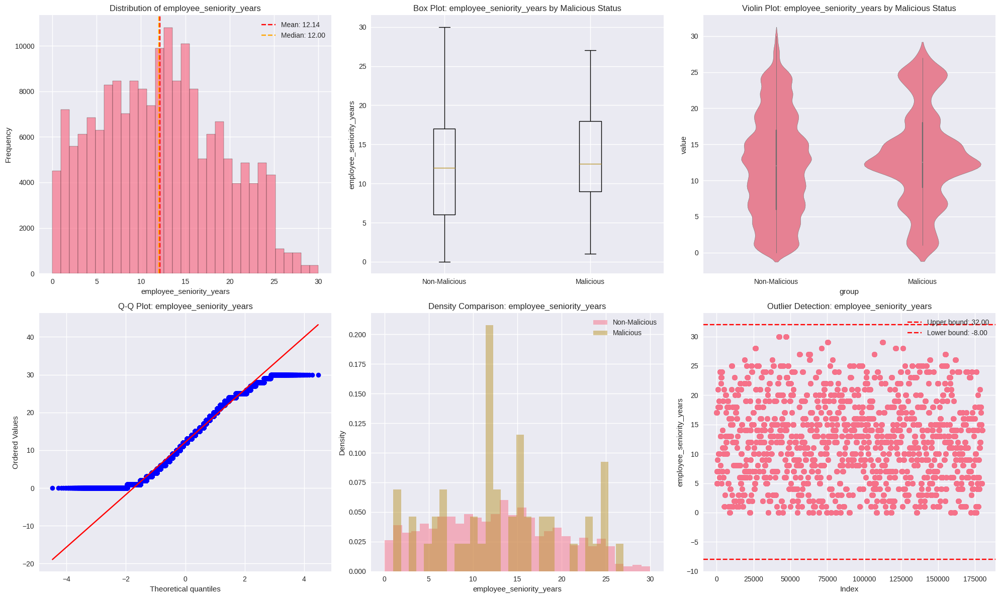


=== PRINT ACTIVITY ANALYSIS ===

=== ANALYSIS OF NUM_PRINT_COMMANDS ===
Basic Statistics:
Count: 180000
Mean: 1.5102
Median: 0.0000
Std: 2.6878
Min: 0.0000
Max: 40.0000
Skewness: 2.5331
Kurtosis: 10.1721
Outliers (IQR method): 16691 (9.27%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 1.4181, Median: 0.0000
Malicious - Count: 9000, Mean: 3.2594, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.6928


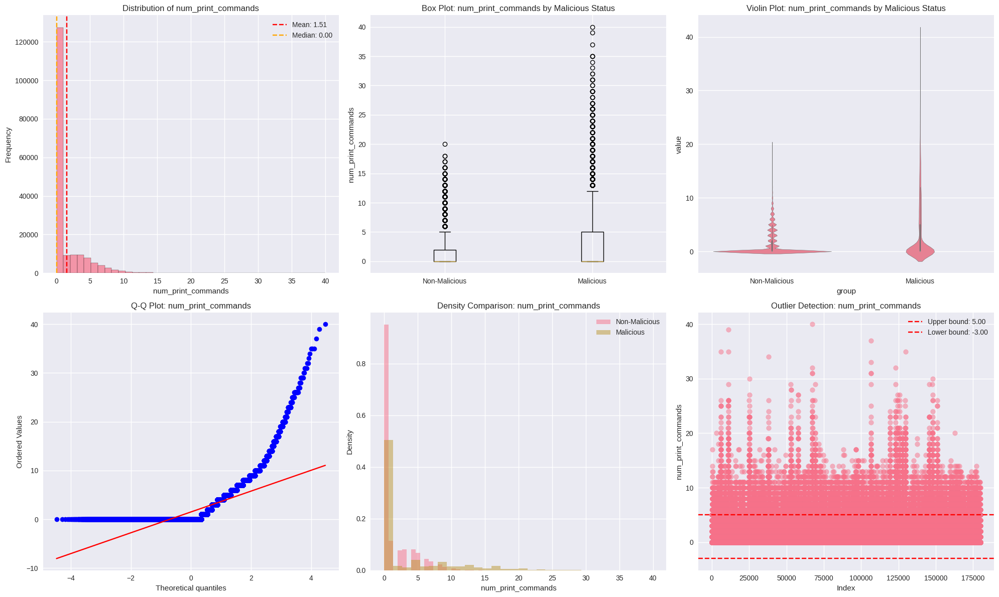


=== ANALYSIS OF TOTAL_PRINTED_PAGES ===
Basic Statistics:
Count: 180000
Mean: 19.8347
Median: 0.0000
Std: 54.2697
Min: 0.0000
Max: 1610.0000
Skewness: 8.2968
Kurtosis: 114.0653
Outliers (IQR method): 31393 (17.44%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 16.2389, Median: 0.0000
Malicious - Count: 9000, Mean: 88.1549, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 1.3841


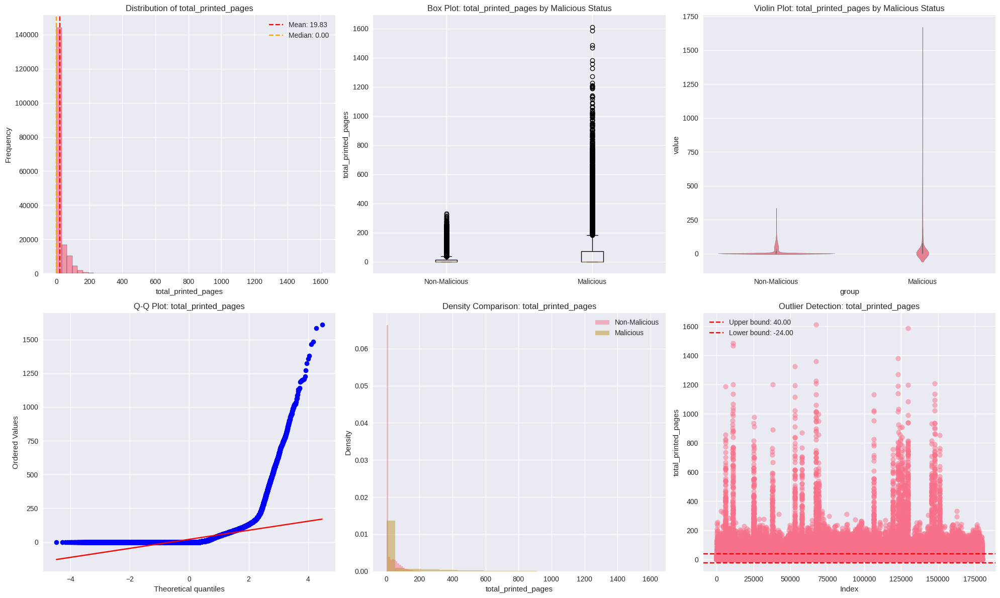


=== ANALYSIS OF NUM_PRINT_COMMANDS_OFF_HOURS ===
Basic Statistics:
Count: 180000
Mean: 0.0864
Median: 0.0000
Std: 0.5542
Min: 0.0000
Max: 24.0000
Skewness: 10.9066
Kurtosis: 188.5123
Outliers (IQR method): 7110 (3.95%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.0692, Median: 0.0000
Malicious - Count: 9000, Mean: 0.4117, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.6235


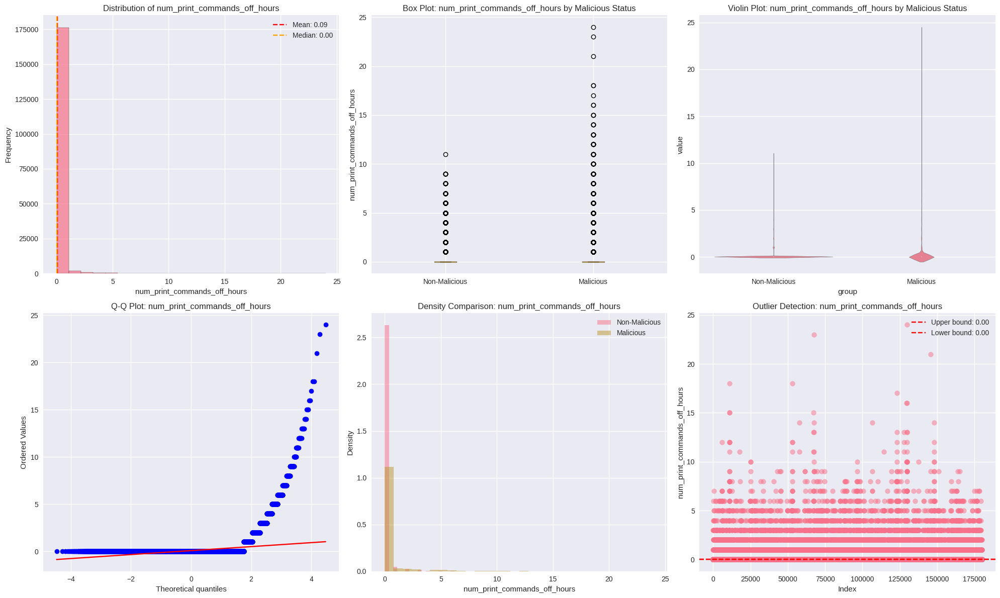


=== ANALYSIS OF NUM_PRINTED_PAGES_OFF_HOURS ===
Basic Statistics:
Count: 180000
Mean: 1.4562
Median: 0.0000
Std: 13.5915
Min: 0.0000
Max: 1074.0000
Skewness: 26.6547
Kurtosis: 1097.4558
Outliers (IQR method): 11962 (6.65%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.9606, Median: 0.0000
Malicious - Count: 9000, Mean: 10.8721, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.7386


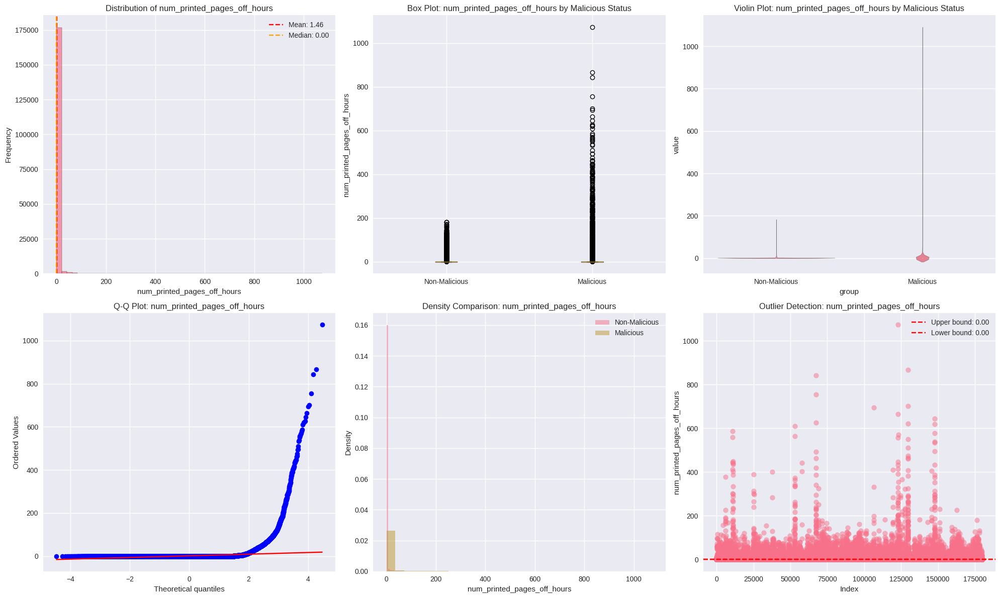


=== ANALYSIS OF NUM_COLOR_PRINTS ===
Basic Statistics:
Count: 180000
Mean: 6.9734
Median: 0.0000
Std: 25.4946
Min: 0.0000
Max: 1082.0000
Skewness: 12.1106
Kurtosis: 244.0780
Outliers (IQR method): 37501 (20.83%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 5.6102, Median: 0.0000
Malicious - Count: 9000, Mean: 32.8734, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 1.0997


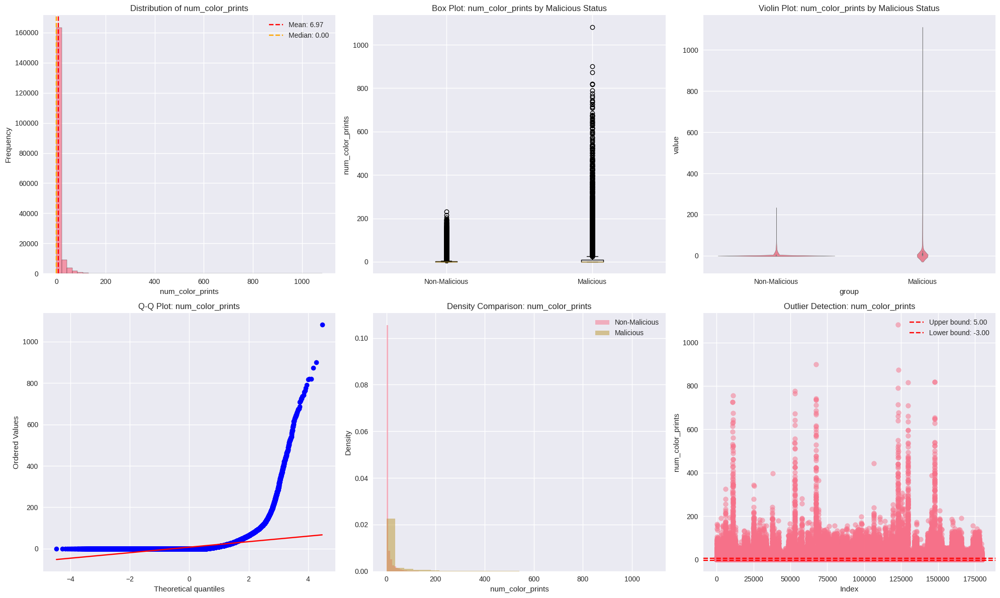


=== ANALYSIS OF NUM_BW_PRINTS ===
Basic Statistics:
Count: 180000
Mean: 12.8613
Median: 0.0000
Std: 33.6185
Min: 0.0000
Max: 972.0000
Skewness: 7.9107
Kurtosis: 105.5170
Outliers (IQR method): 25824 (14.35%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 10.6286, Median: 0.0000
Malicious - Count: 9000, Mean: 55.2814, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 1.3876


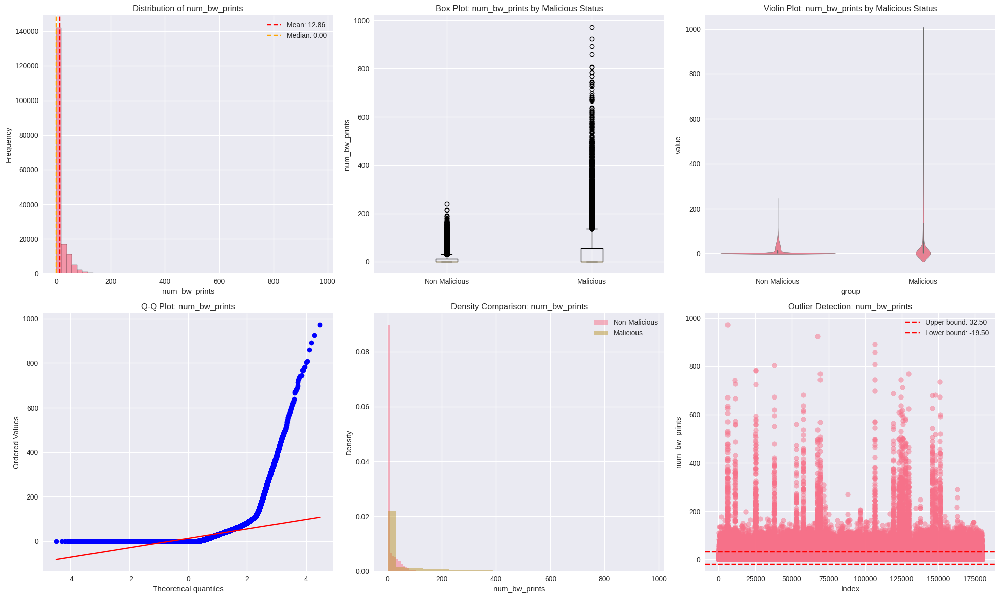


=== ANALYSIS OF RATIO_COLOR_PRINTS ===
Basic Statistics:
Count: 180000
Mean: 0.0982
Median: 0.0000
Std: 0.1732
Min: 0.0000
Max: 1.0000
Skewness: 1.9349
Kurtosis: 3.1501
Outliers (IQR method): 13699 (7.61%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.0982, Median: 0.0000
Malicious - Count: 9000, Mean: 0.0984, Median: 0.0000
Mann-Whitney U test p-value: 0.0853
Significant difference: No
Cohen's d (effect size): 0.0008


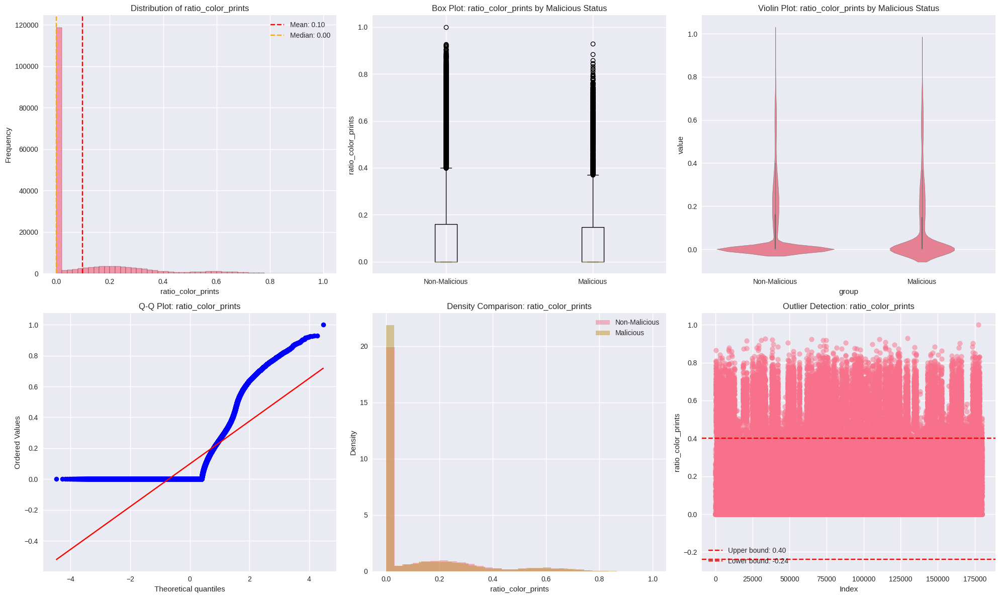


=== ANALYSIS OF PRINTED_FROM_OTHER ===
Basic Statistics:
Count: 180000
Mean: 0.0222
Median: 0.0000
Std: 0.1474
Min: 0.0000
Max: 1.0000
Skewness: 6.4834
Kurtosis: 40.0351
Outliers (IQR method): 3999 (2.22%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.0182, Median: 0.0000
Malicious - Count: 9000, Mean: 0.0987, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.5499


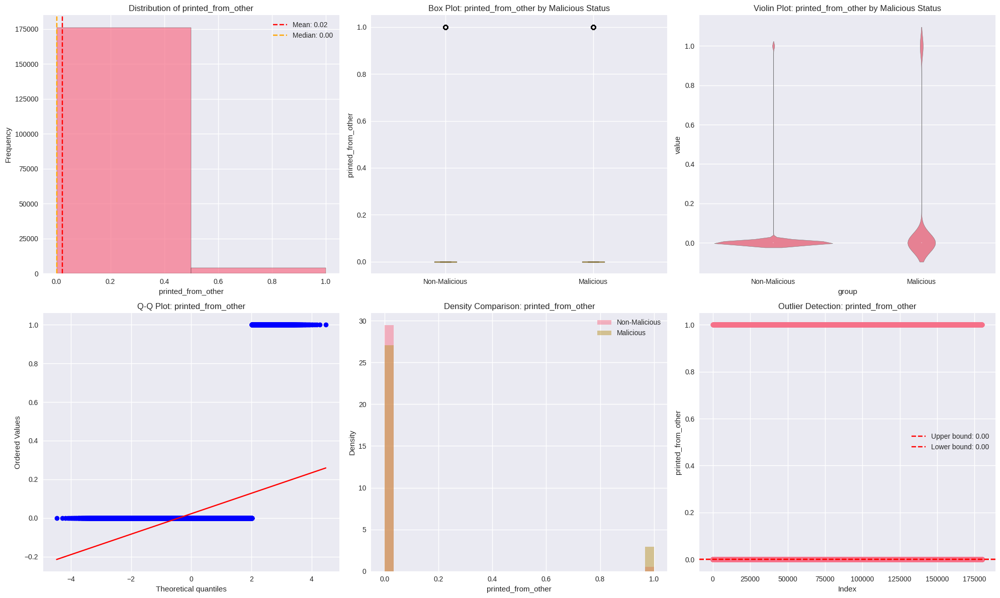


=== ANALYSIS OF PRINT_CAMPUSES ===
Basic Statistics:
Count: 180000
Mean: 0.3896
Median: 0.0000
Std: 0.5387
Min: 0.0000
Max: 3.0000
Skewness: 1.0262
Kurtosis: 0.4534
Outliers (IQR method): 359 (0.20%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.3842, Median: 0.0000
Malicious - Count: 9000, Mean: 0.4919, Median: 0.0000
Mann-Whitney U test p-value: 0.0007
Significant difference: Yes
Cohen's d (effect size): 0.2000


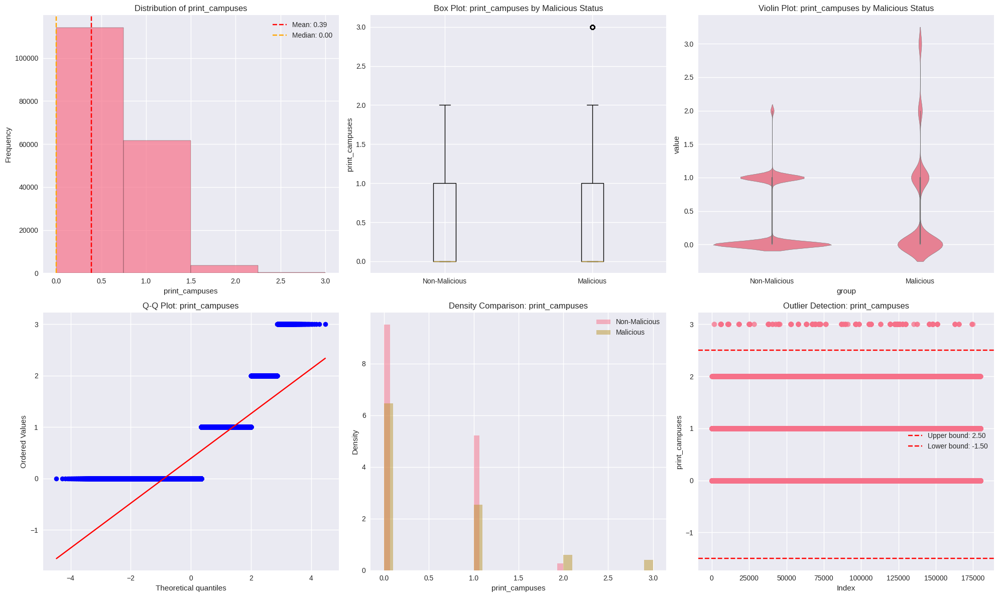


=== BURN ACTIVITY ANALYSIS ===

=== ANALYSIS OF NUM_BURN_REQUESTS ===
Basic Statistics:
Count: 180000
Mean: 0.3183
Median: 0.0000
Std: 1.2203
Min: 0.0000
Max: 22.0000
Skewness: 5.2140
Kurtosis: 35.6535
Outliers (IQR method): 17005 (9.45%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.2585, Median: 0.0000
Malicious - Count: 9000, Mean: 1.4549, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 1.0036


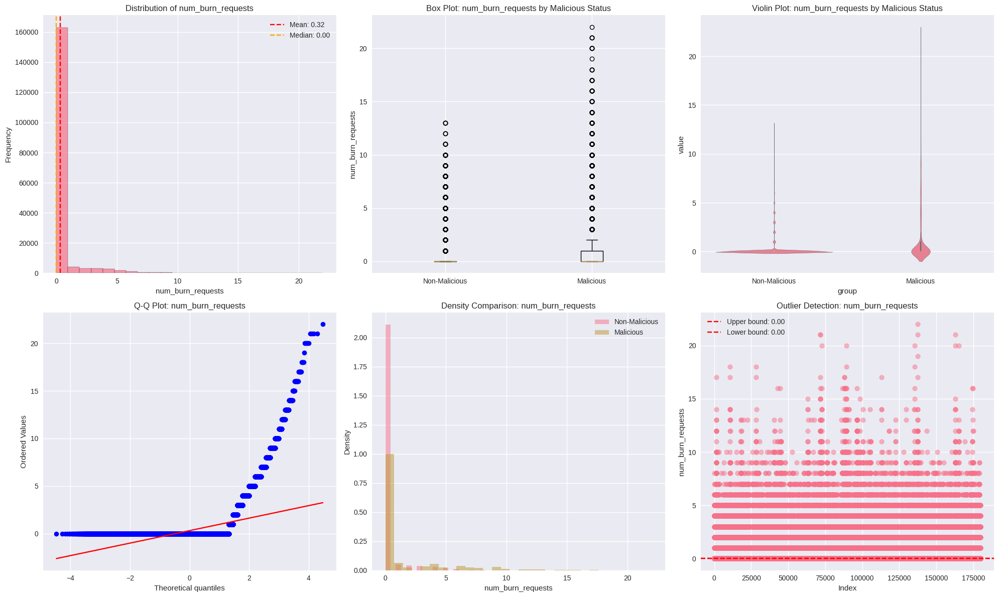


=== ANALYSIS OF MAX_REQUEST_CLASSIFICATION ===
Basic Statistics:
Count: 180000
Mean: 0.1420
Median: 0.0000
Std: 0.5035
Min: 0.0000
Max: 4.0000
Skewness: 4.3822
Kurtosis: 22.0244
Outliers (IQR method): 17005 (9.45%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.1113, Median: 0.0000
Malicious - Count: 9000, Mean: 0.7264, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 1.2675


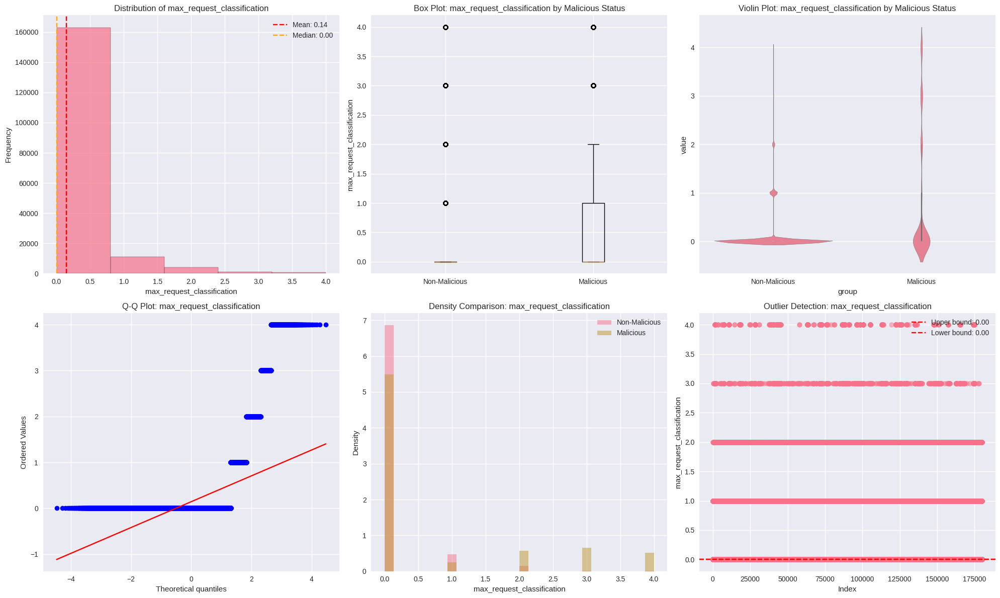


=== ANALYSIS OF AVG_REQUEST_CLASSIFICATION ===
Basic Statistics:
Count: 180000
Mean: 0.1242
Median: 0.0000
Std: 0.4184
Min: 0.0000
Max: 4.0000
Skewness: 3.8748
Kurtosis: 17.1264
Outliers (IQR method): 17005 (9.45%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.1024, Median: 0.0000
Malicious - Count: 9000, Mean: 0.5390, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 1.0715


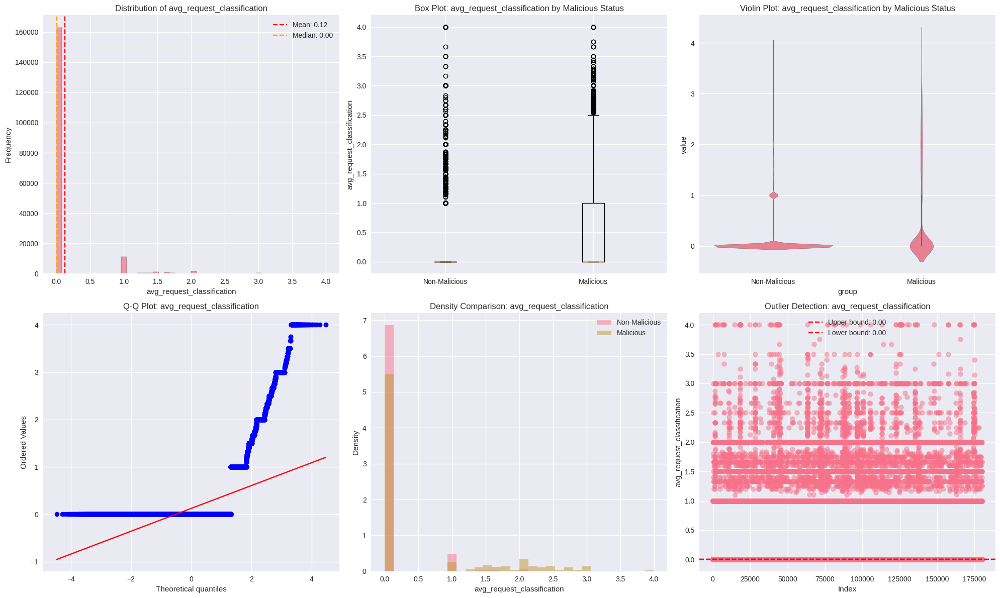


=== ANALYSIS OF NUM_BURN_REQUESTS_OFF_HOURS ===
Basic Statistics:
Count: 180000
Mean: 0.0121
Median: 0.0000
Std: 0.2319
Min: 0.0000
Max: 13.0000
Skewness: 24.5689
Kurtosis: 722.5255
Outliers (IQR method): 687 (0.38%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.0000, Median: 0.0000
Malicious - Count: 9000, Mean: 0.2412, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 1.0682


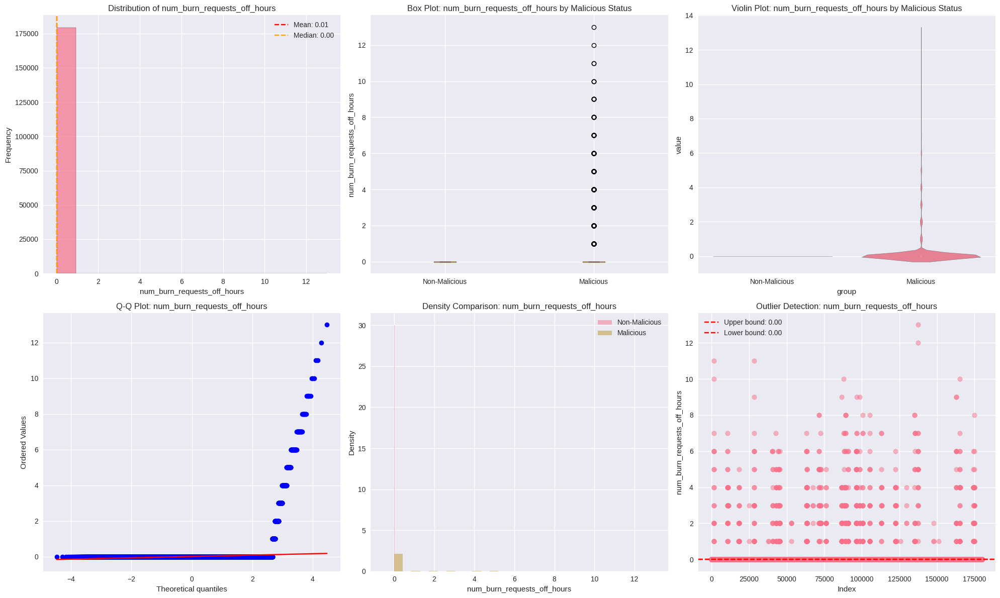


=== ANALYSIS OF TOTAL_BURN_VOLUME_MB ===
Basic Statistics:
Count: 180000
Mean: 160.8855
Median: 0.0000
Std: 1191.2567
Min: 0.0000
Max: 220013.0000
Skewness: 53.5746
Kurtosis: 7299.2724
Outliers (IQR method): 17005 (9.45%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 130.4710, Median: 0.0000
Malicious - Count: 9000, Mean: 738.7611, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.5138


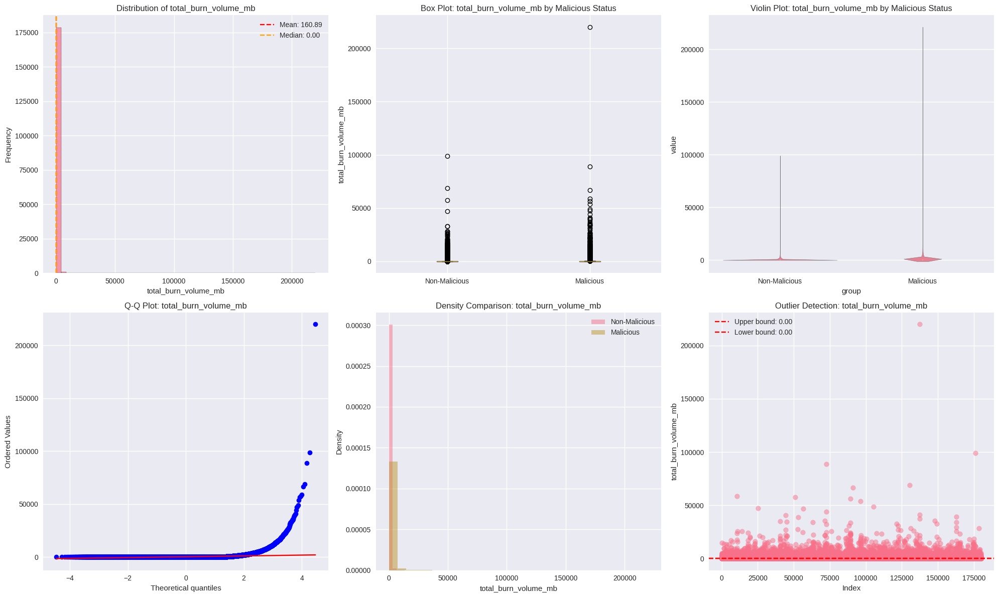


=== ANALYSIS OF TOTAL_FILES_BURNED ===
Basic Statistics:
Count: 180000
Mean: 3.7323
Median: 0.0000
Std: 13.5367
Min: 0.0000
Max: 179.0000
Skewness: 4.6293
Kurtosis: 26.3825
Outliers (IQR method): 17005 (9.45%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 2.8141, Median: 0.0000
Malicious - Count: 9000, Mean: 21.1777, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 1.4201


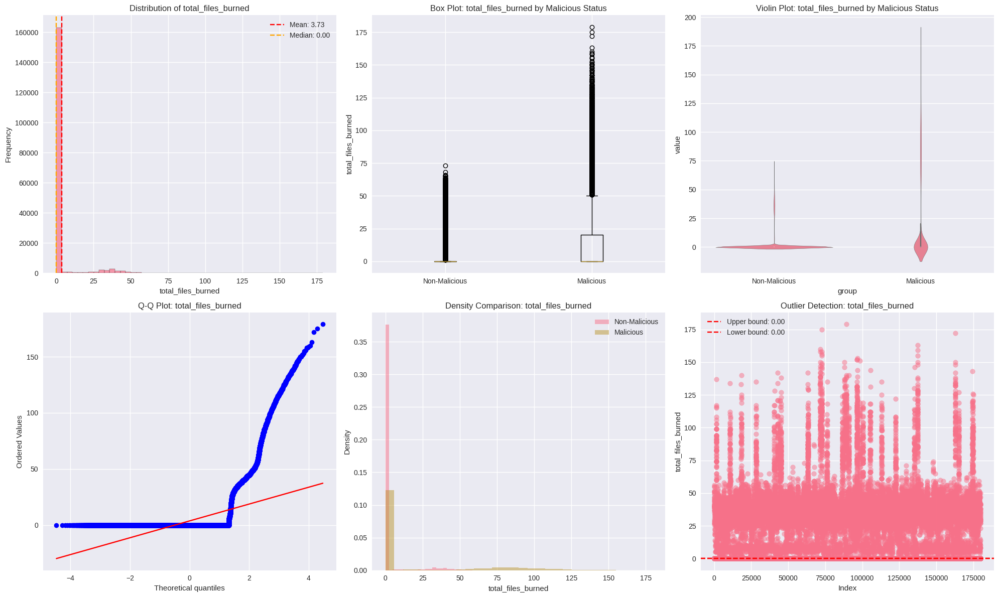


=== ANALYSIS OF BURNED_FROM_OTHER ===
Basic Statistics:
Count: 180000
Mean: 0.0027
Median: 0.0000
Std: 0.0517
Min: 0.0000
Max: 1.0000
Skewness: 19.2472
Kurtosis: 368.4569
Outliers (IQR method): 482 (0.27%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.0000, Median: 0.0000
Malicious - Count: 9000, Mean: 0.0536, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 1.0638


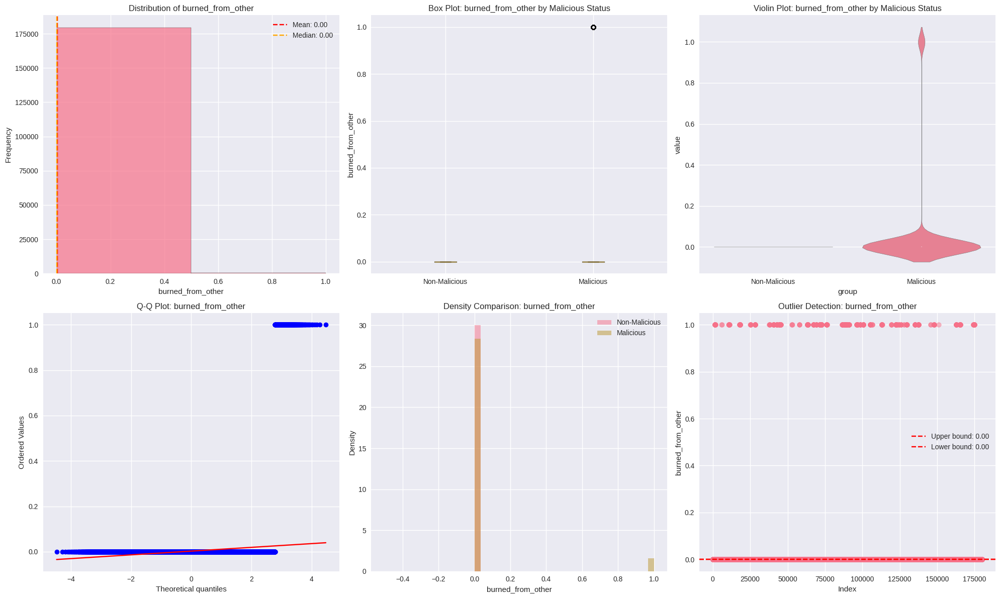


=== ANALYSIS OF BURN_CAMPUSES ===
Basic Statistics:
Count: 180000
Mean: 0.0984
Median: 0.0000
Std: 0.3148
Min: 0.0000
Max: 3.0000
Skewness: 3.4255
Kurtosis: 14.1411
Outliers (IQR method): 17005 (9.45%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.0854, Median: 0.0000
Malicious - Count: 9000, Mean: 0.3462, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.8425


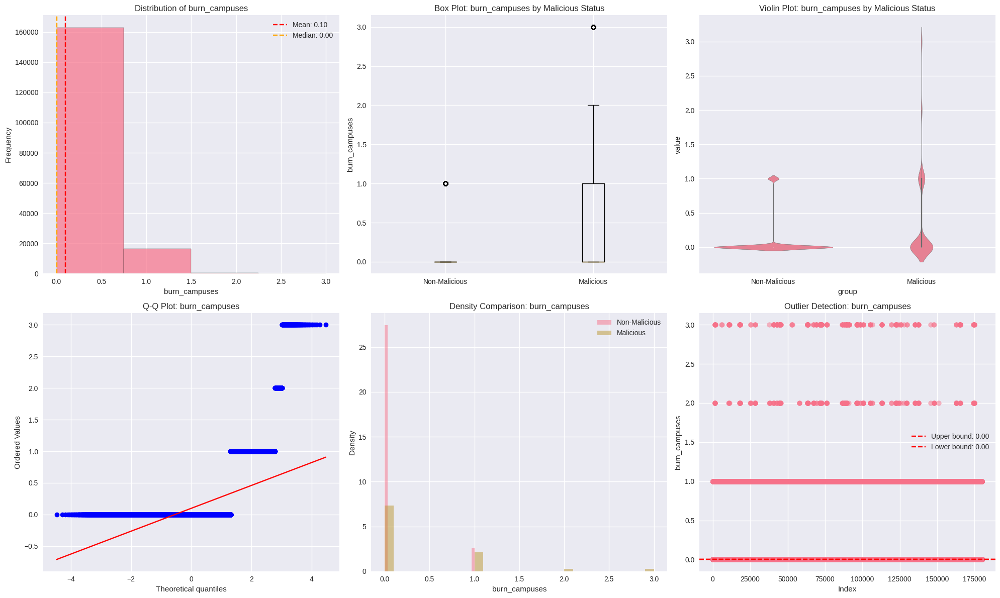


=== TRAVEL ANALYSIS ===

=== ANALYSIS OF TRIP_DAY_NUMBER ===
Basic Statistics:
Count: 4053
Mean: 5.2709
Median: 5.0000
Std: 3.3966
Min: 1.0000
Max: 14.0000
Skewness: 0.5919
Kurtosis: -0.5828
Outliers (IQR method): 0 (0.00%)

Comparison between groups:
Non-malicious - Count: 3728, Mean: 5.2521, Median: 5.0000
Malicious - Count: 325, Mean: 5.4862, Median: 5.0000
Mann-Whitney U test p-value: 0.2256
Significant difference: No
Cohen's d (effect size): 0.0689


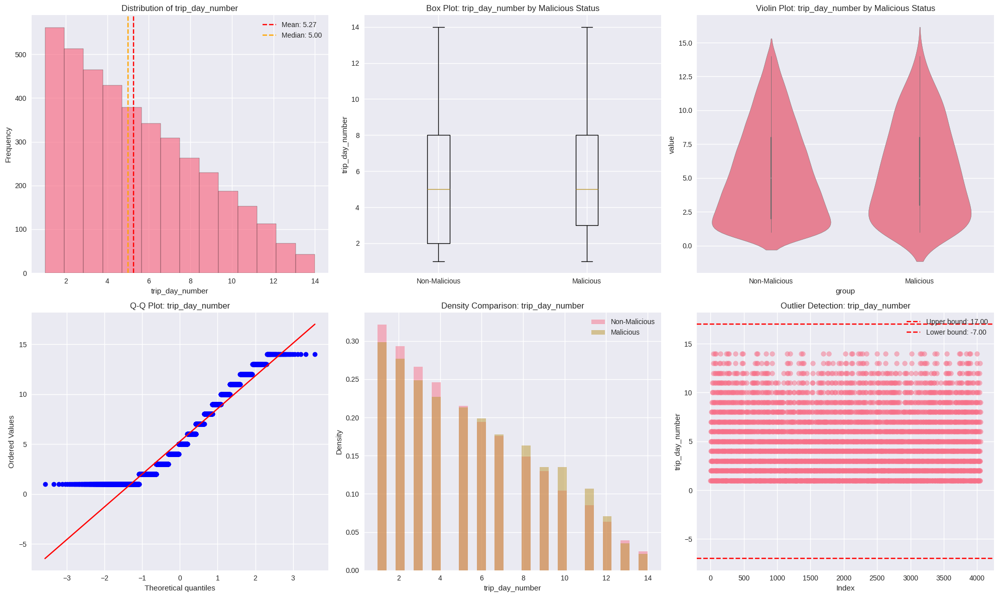


=== BUILDING ACCESS ANALYSIS ===

=== ANALYSIS OF NUM_ENTRIES ===
Basic Statistics:
Count: 180000
Mean: 0.6868
Median: 1.0000
Std: 0.6870
Min: 0.0000
Max: 4.0000
Skewness: 0.6267
Kurtosis: -0.0744
Outliers (IQR method): 588 (0.33%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.6713, Median: 1.0000
Malicious - Count: 9000, Mean: 0.9810, Median: 1.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.4529


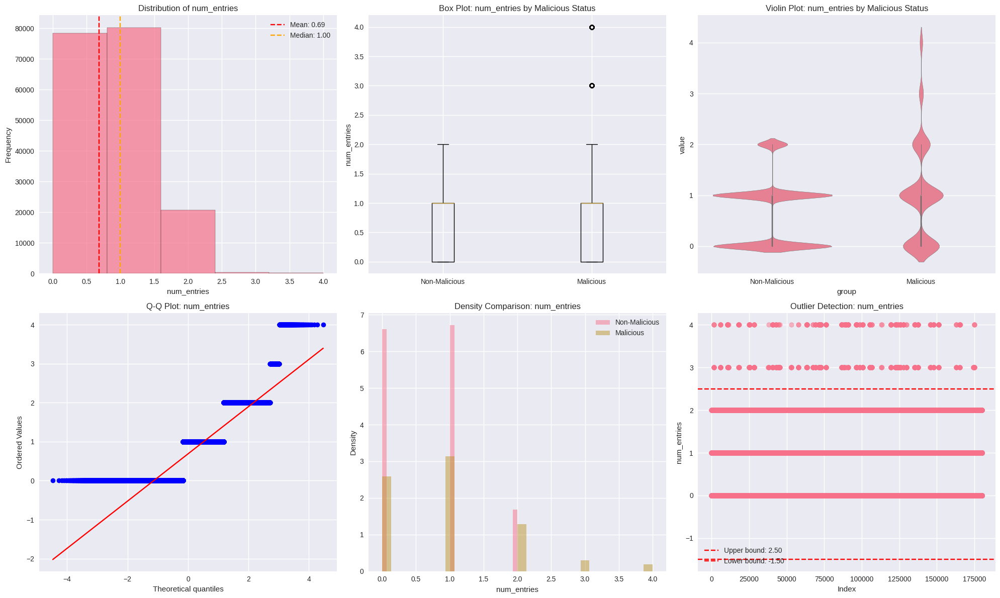


=== ANALYSIS OF NUM_EXITS ===
Basic Statistics:
Count: 180000
Mean: 0.6868
Median: 1.0000
Std: 0.6870
Min: 0.0000
Max: 4.0000
Skewness: 0.6267
Kurtosis: -0.0744
Outliers (IQR method): 588 (0.33%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.6713, Median: 1.0000
Malicious - Count: 9000, Mean: 0.9810, Median: 1.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.4529


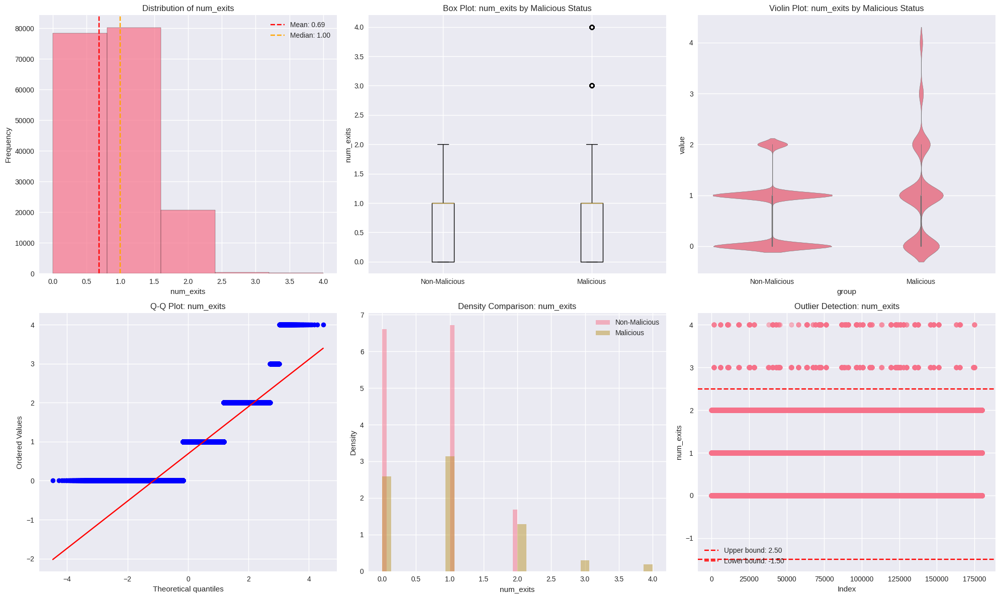


=== ANALYSIS OF TOTAL_PRESENCE_MINUTES ===
Basic Statistics:
Count: 180000
Mean: 311.0264
Median: 424.0000
Std: 289.2719
Min: 0.0000
Max: 1080.0000
Skewness: 0.0661
Kurtosis: -1.5690
Outliers (IQR method): 0 (0.00%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 306.4720, Median: 417.0000
Malicious - Count: 9000, Mean: 397.5603, Median: 499.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.3156


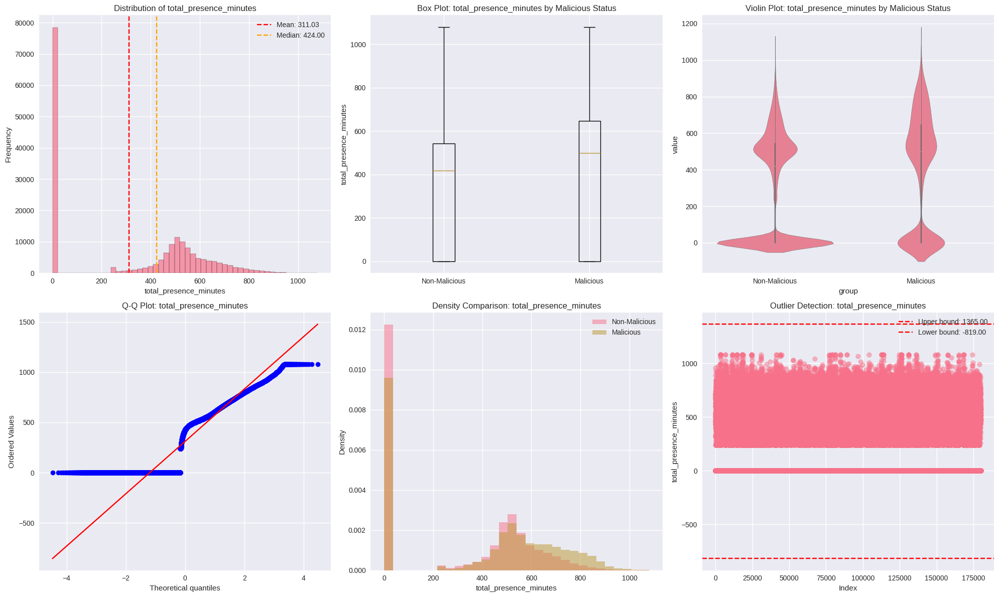


=== ANALYSIS OF ENTERED_DURING_NIGHT_HOURS ===
Basic Statistics:
Count: 180000
Mean: 0.0122
Median: 0.0000
Std: 0.1099
Min: 0.0000
Max: 1.0000
Skewness: 8.8787
Kurtosis: 76.8327
Outliers (IQR method): 2200 (1.22%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.0099, Median: 0.0000
Malicious - Count: 9000, Mean: 0.0562, Median: 0.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.4233


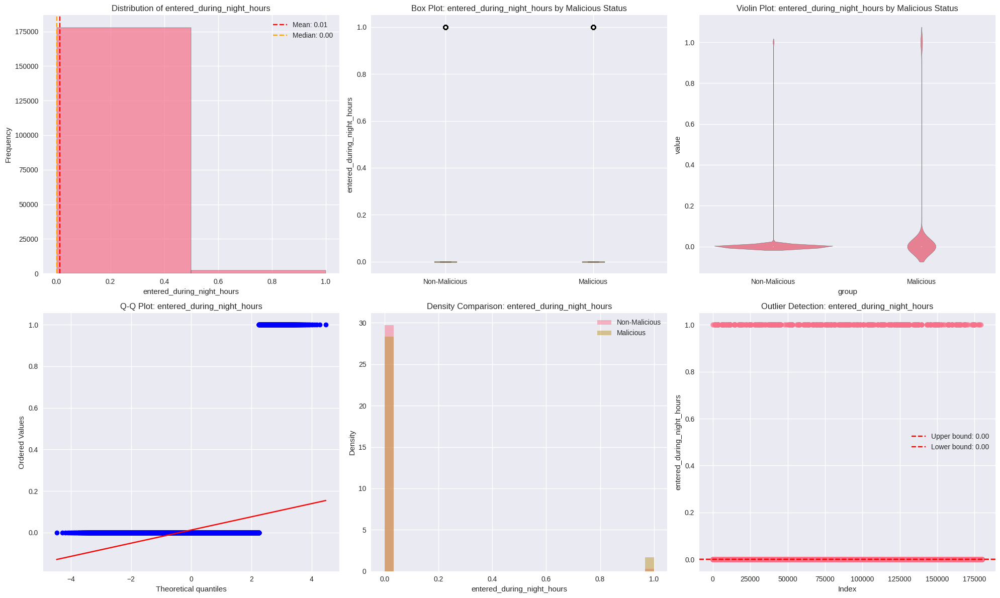


=== ANALYSIS OF NUM_UNIQUE_CAMPUS ===
Basic Statistics:
Count: 180000
Mean: 0.5709
Median: 1.0000
Std: 0.5129
Min: 0.0000
Max: 3.0000
Skewness: 0.0138
Kurtosis: -0.7938
Outliers (IQR method): 401 (0.22%)

Comparison between groups:
Non-malicious - Count: 171000, Mean: 0.5594, Median: 1.0000
Malicious - Count: 9000, Mean: 0.7909, Median: 1.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.4536


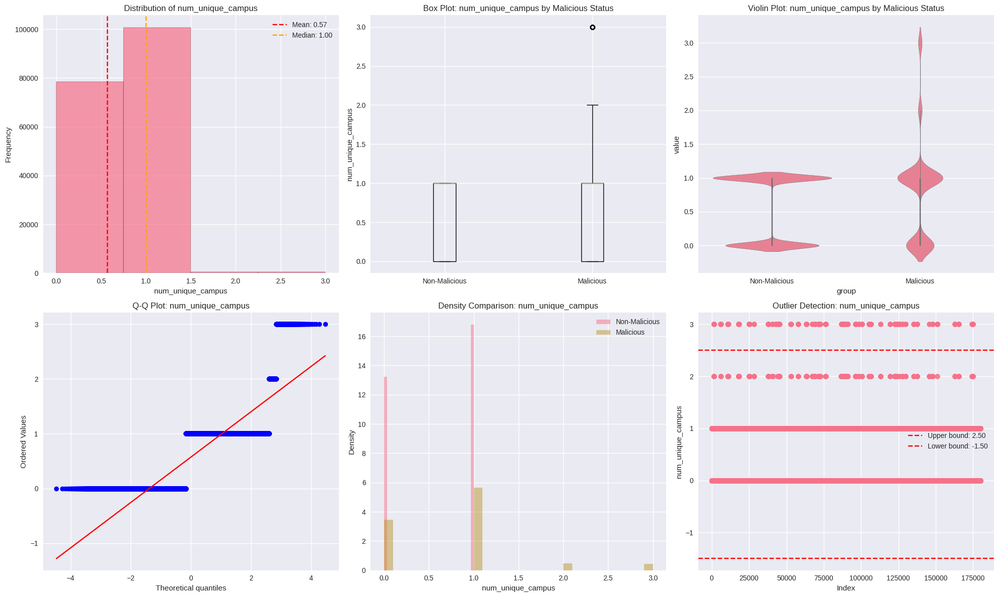


=== ANALYSIS OF FIRST_ENTRY_TIME_MINUTES ===
Basic Statistics:
Count: 101545
Mean: 496.5751
Median: 491.0000
Std: 59.1119
Min: 300.0000
Max: 720.0000
Skewness: 0.1620
Kurtosis: 2.4231
Outliers (IQR method): 5534 (5.45%)

Comparison between groups:
Non-malicious - Count: 95652, Mean: 497.7543, Median: 491.0000
Malicious - Count: 5893, Mean: 477.4351, Median: 483.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): -0.3449


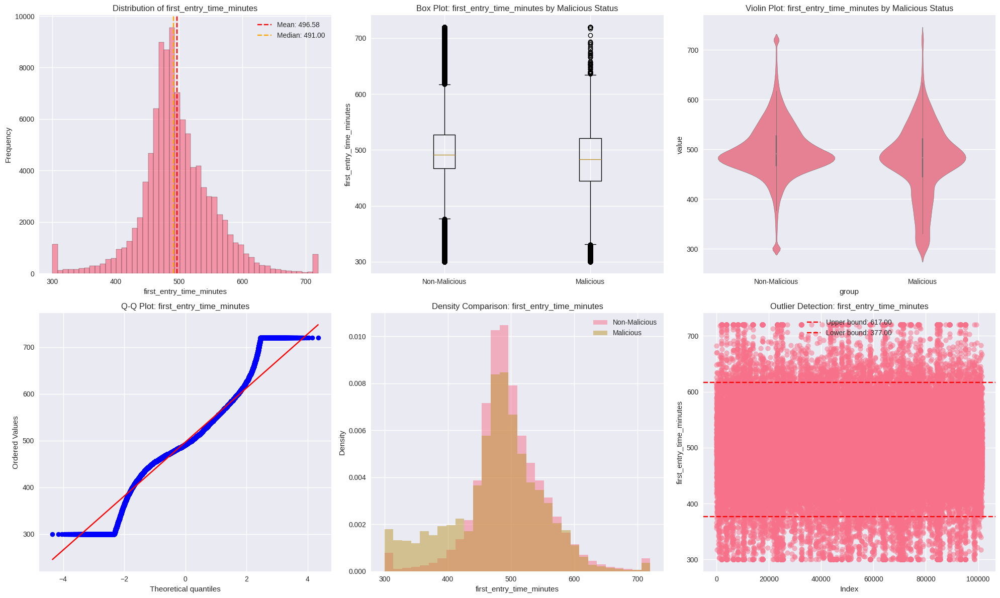


=== ANALYSIS OF LAST_EXIT_TIME_MINUTES ===
Basic Statistics:
Count: 101545
Mean: 1048.3934
Median: 1023.0000
Std: 116.9260
Min: 540.0000
Max: 1380.0000
Skewness: 0.4063
Kurtosis: 0.5060
Outliers (IQR method): 2204 (2.17%)

Comparison between groups:
Non-malicious - Count: 95652, Mean: 1046.1316, Median: 1021.0000
Malicious - Count: 5893, Mean: 1085.1057, Median: 1055.0000
Mann-Whitney U test p-value: 0.0000
Significant difference: Yes
Cohen's d (effect size): 0.3343


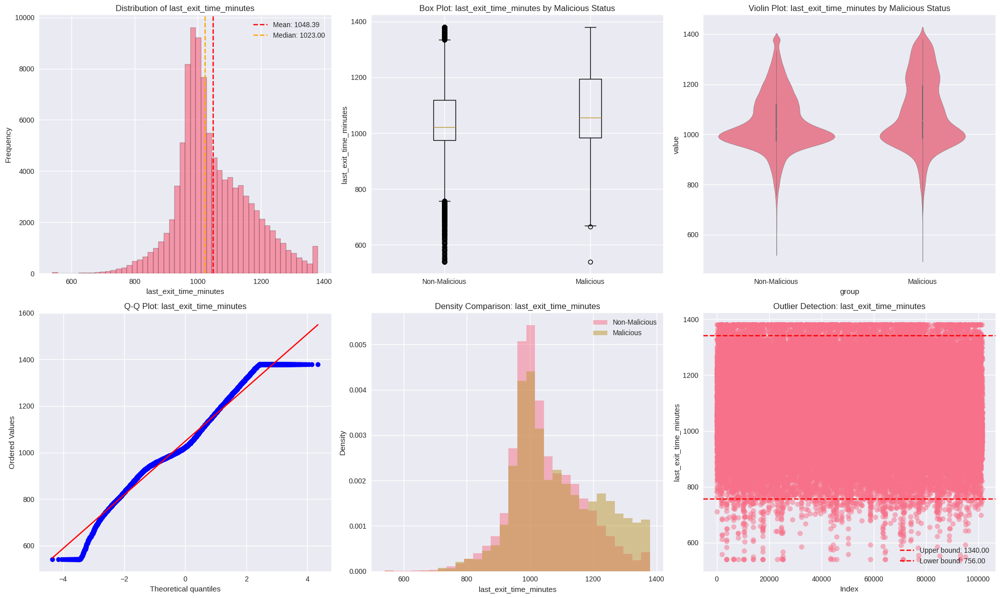

In [ ]:
df_processed = run_numerical_analysis(df)

=== TEMPORAL ANALYSIS ===


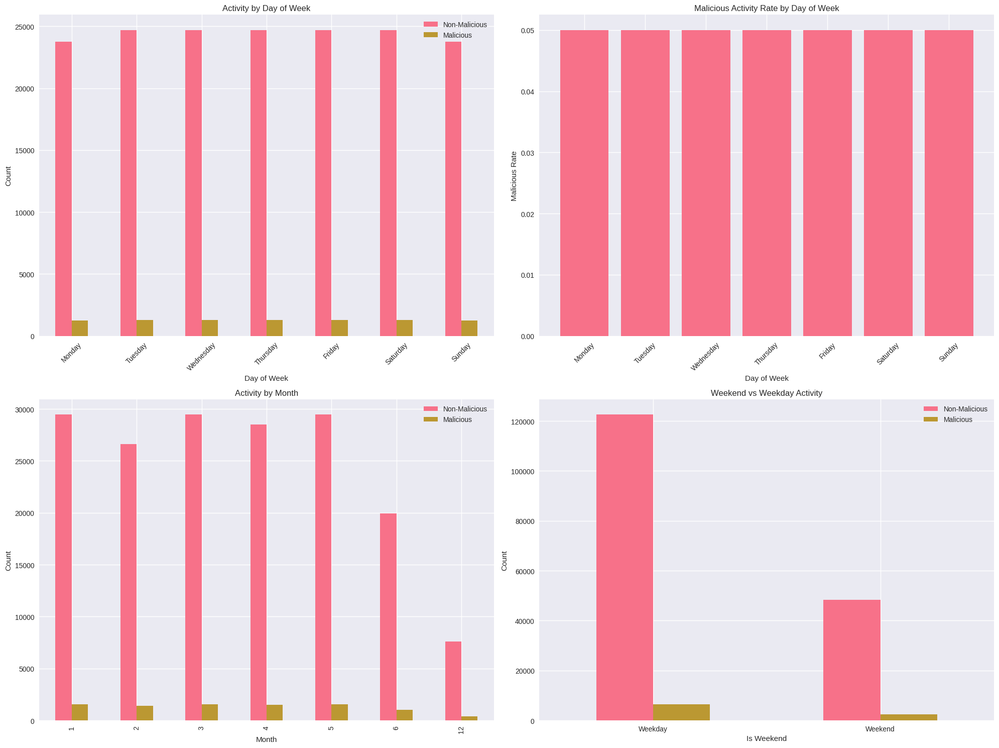


Time series analysis:


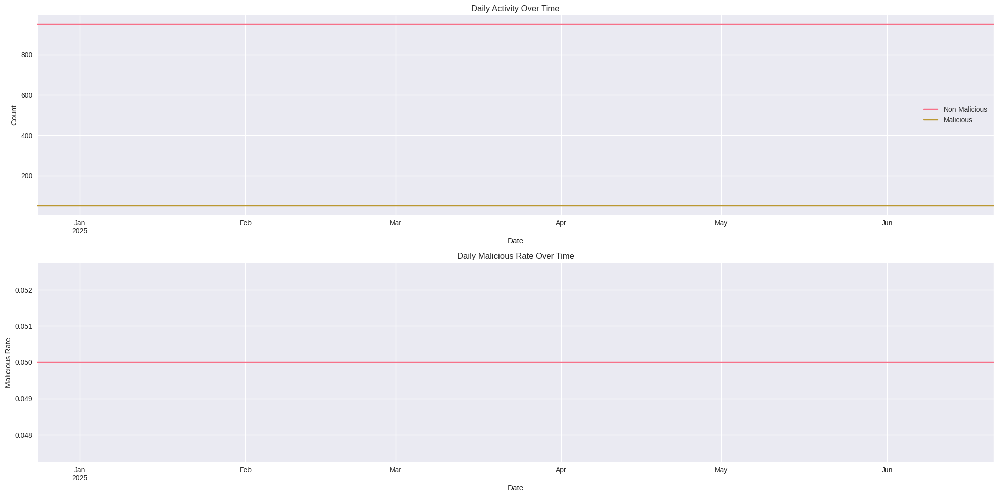

In [ ]:
# =============================================================================
# STEP 6: TEMPORAL ANALYSIS
# =============================================================================

"""
Purpose: Analyze temporal patterns in the data to identify time-based behaviors
that might indicate malicious activity. This includes daily, weekly, and monthly patterns.
"""

# Daily activity patterns
print("=== TEMPORAL ANALYSIS ===")

# Activity by day of week
daily_activity = df.groupby(['day_name', 'is_malicious']).size().unstack(fill_value=0)
daily_activity_pct = daily_activity.div(daily_activity.sum(axis=1), axis=0)

fig, axes = plt.subplots(2, 2, figsize=(20, 15))

# Activity by day of week
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
daily_activity_ordered = daily_activity.reindex(days_order)
daily_activity_ordered.plot(kind='bar', ax=axes[0,0])
axes[0,0].set_title('Activity by Day of Week')
axes[0,0].set_xlabel('Day of Week')
axes[0,0].set_ylabel('Count')
axes[0,0].legend(['Non-Malicious', 'Malicious'])
axes[0,0].tick_params(axis='x', rotation=45)

# Malicious activity rate by day
malicious_rate_by_day = df.groupby('day_name')['is_malicious'].mean().reindex(days_order)
axes[0,1].bar(range(len(malicious_rate_by_day)), malicious_rate_by_day.values)
axes[0,1].set_title('Malicious Activity Rate by Day of Week')
axes[0,1].set_xlabel('Day of Week')
axes[0,1].set_ylabel('Malicious Rate')
axes[0,1].set_xticks(range(len(malicious_rate_by_day)))
axes[0,1].set_xticklabels(malicious_rate_by_day.index, rotation=45)

# Activity by month
monthly_activity = df.groupby(['month', 'is_malicious']).size().unstack(fill_value=0)
monthly_activity.plot(kind='bar', ax=axes[1,0])
axes[1,0].set_title('Activity by Month')
axes[1,0].set_xlabel('Month')
axes[1,0].set_ylabel('Count')
axes[1,0].legend(['Non-Malicious', 'Malicious'])

# Weekend vs weekday analysis
weekend_activity = df.groupby(['is_weekend', 'is_malicious']).size().unstack(fill_value=0)
weekend_activity.plot(kind='bar', ax=axes[1,1])
axes[1,1].set_title('Weekend vs Weekday Activity')
axes[1,1].set_xlabel('Is Weekend')
axes[1,1].set_ylabel('Count')
axes[1,1].legend(['Non-Malicious', 'Malicious'])
axes[1,1].set_xticklabels(['Weekday', 'Weekend'], rotation=0)

plt.tight_layout()
plt.show()

# Time series analysis
print("\nTime series analysis:")
daily_counts = df.groupby(['date', 'is_malicious']).size().unstack(fill_value=0)
daily_malicious_rate = df.groupby('date')['is_malicious'].mean()

fig, axes = plt.subplots(2, 1, figsize=(20, 10))

# Daily activity over time
daily_counts.plot(ax=axes[0])
axes[0].set_title('Daily Activity Over Time')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Count')
axes[0].legend(['Non-Malicious', 'Malicious'])

# Daily malicious rate over time
daily_malicious_rate.plot(ax=axes[1])
axes[1].set_title('Daily Malicious Rate Over Time')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Malicious Rate')

plt.tight_layout()
plt.show()

=== PRINT ACTIVITY DETAILED ANALYSIS ===
Print Activity Summary by Malicious Status:
             num_print_commands                total_printed_pages         \
                           mean median     std                mean median   
is_malicious                                                                
0                        1.4181    0.0  2.3893             16.2389    0.0   
1                        3.2594    0.0  5.7274             88.1549    0.0   

                       num_print_commands_off_hours                 \
                   std                         mean median     std   
is_malicious                                                         
0              32.0321                       0.0692    0.0  0.4320   
1             185.7398                       0.4117    0.0  1.5769   

             ratio_color_prints                 
                           mean median     std  
is_malicious                                    
0                        0.0982

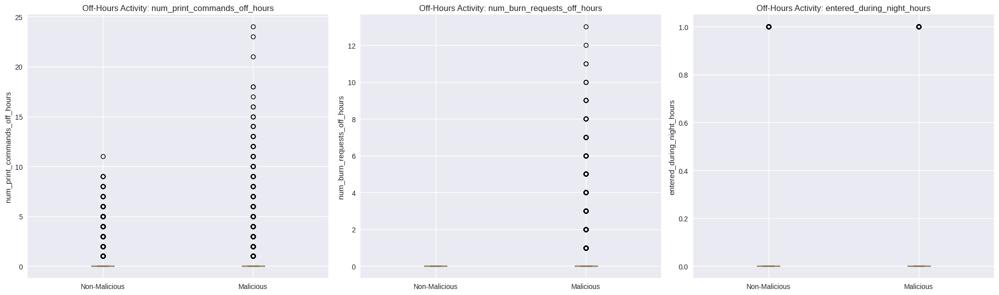

In [ ]:
# =============================================================================
# STEP 7: ACTIVITY-SPECIFIC ANALYSIS
# =============================================================================

"""
Purpose: Deep dive into specific activities (printing, burning, travel, building access)
to identify patterns that distinguish malicious from non-malicious behavior.
"""

# Print Activity Analysis
print("=== PRINT ACTIVITY DETAILED ANALYSIS ===")

# Print activity summary
print_summary = df.groupby('is_malicious').agg({
    'num_print_commands': ['mean', 'median', 'std'],
    'total_printed_pages': ['mean', 'median', 'std'],
    'num_print_commands_off_hours': ['mean', 'median', 'std'],
    'ratio_color_prints': ['mean', 'median', 'std']
}).round(4)
print("Print Activity Summary by Malicious Status:")
print(print_summary)

# Burn Activity Analysis
print("\n=== BURN ACTIVITY DETAILED ANALYSIS ===")

burn_summary = df.groupby('is_malicious').agg({
    'num_burn_requests': ['mean', 'median', 'std'],
    'total_burn_volume_mb': ['mean', 'median', 'std'],
    'total_files_burned': ['mean', 'median', 'std'],
    'max_request_classification': ['mean', 'median', 'std']
}).round(4)
print("Burn Activity Summary by Malicious Status:")
print(burn_summary)

# Building Access Analysis
print("\n=== BUILDING ACCESS DETAILED ANALYSIS ===")

access_summary = df.groupby('is_malicious').agg({
    'num_entries': ['mean', 'median', 'std'],
    'total_presence_minutes': ['mean', 'median', 'std'],
    'entered_during_night_hours': ['mean', 'median', 'std'],
    'num_unique_campus': ['mean', 'median', 'std']
}).round(4)
print("Building Access Summary by Malicious Status:")
print(access_summary)

# Off-hours activity analysis
print("\n=== OFF-HOURS ACTIVITY ANALYSIS ===")

off_hours_cols = ['num_print_commands_off_hours', 'num_burn_requests_off_hours',
                  'entered_during_night_hours']

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for i, col in enumerate(off_hours_cols):
    if col in df.columns:
        # Compare off-hours activity between malicious and non-malicious
        malicious_off_hours = df[df['is_malicious'] == 1][col].dropna()
        non_malicious_off_hours = df[df['is_malicious'] == 0][col].dropna()

        box_data = [non_malicious_off_hours, malicious_off_hours]
        axes[i].boxplot(box_data, labels=['Non-Malicious', 'Malicious'])
        axes[i].set_title(f'Off-Hours Activity: {col}')
        axes[i].set_ylabel(col)

plt.tight_layout()
plt.show()

=== CORRELATION ANALYSIS ===
Analyzing correlations for 44 numerical columns
Columns: ['employee_seniority_years', 'is_contractor', 'employee_classification', 'has_foreign_citizenship', 'has_criminal_record', 'has_medical_history', 'is_malicious', 'risk_travel_indicator', 'num_print_commands', 'total_printed_pages']...
Correlation matrix shape: (44, 44)


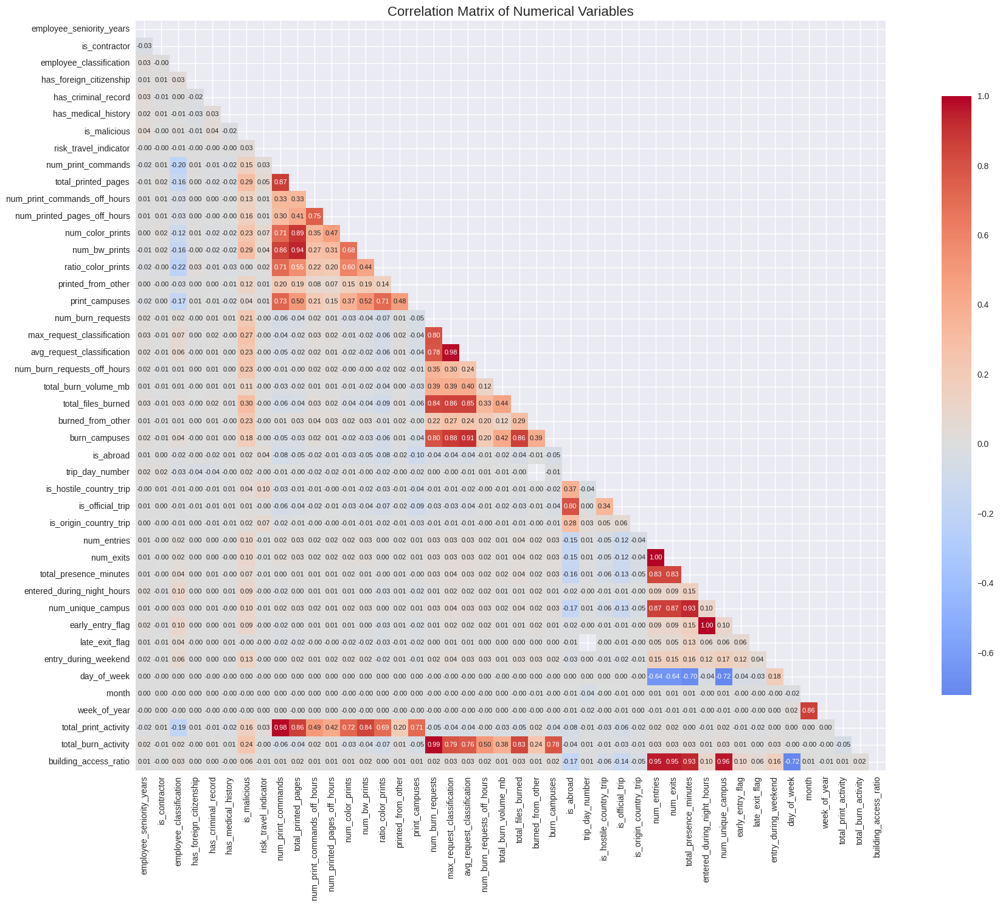


=== HIGH CORRELATION PAIRS ===
High Correlation Pairs (|r| > 0.7):
  num_print_commands - total_printed_pages: 0.865
  num_print_commands - num_color_prints: 0.712
  num_print_commands - num_bw_prints: 0.857
  num_print_commands - ratio_color_prints: 0.708
  num_print_commands - print_campuses: 0.726
  num_print_commands - total_print_activity: 0.984
  total_printed_pages - num_color_prints: 0.891
  total_printed_pages - num_bw_prints: 0.939
  total_printed_pages - total_print_activity: 0.860
  num_print_commands_off_hours - num_printed_pages_off_hours: 0.755
  num_color_prints - total_print_activity: 0.722
  num_bw_prints - total_print_activity: 0.841
  ratio_color_prints - print_campuses: 0.711
  print_campuses - total_print_activity: 0.709
  num_burn_requests - max_request_classification: 0.799
  num_burn_requests - avg_request_classification: 0.781
  num_burn_requests - total_files_burned: 0.839
  num_burn_requests - burn_campuses: 0.803
  num_burn_requests - total_burn_activity: 

In [ ]:
# =============================================================================
# STEP 8: CORRELATION ANALYSIS (FIXED)
# =============================================================================

"""
Purpose: Identify relationships between different variables and detect potential
multicollinearity issues. This helps understand which features might be redundant
or which combinations of features are most predictive.
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def perform_correlation_analysis(df):
    """
    Perform comprehensive correlation analysis
    """
    print("=== CORRELATION ANALYSIS ===")

    # Select numerical columns for correlation analysis
    numerical_cols_for_corr = df.select_dtypes(include=[np.number]).columns.tolist()

    # Remove ID columns and other non-meaningful numerical columns
    cols_to_remove = ['employee_id', 'user_id']  # Add other ID columns if they exist
    for col in cols_to_remove:
        if col in numerical_cols_for_corr:
            numerical_cols_for_corr.remove(col)

    print(f"Analyzing correlations for {len(numerical_cols_for_corr)} numerical columns")
    print(f"Columns: {numerical_cols_for_corr[:10]}...")  # Show first 10 columns

    # Check if we have enough columns
    if len(numerical_cols_for_corr) < 2:
        print("Not enough numerical columns for correlation analysis")
        return

    # Calculate correlation matrix
    try:
        correlation_matrix = df[numerical_cols_for_corr].corr()
        print(f"Correlation matrix shape: {correlation_matrix.shape}")
    except Exception as e:
        print(f"Error calculating correlation matrix: {e}")
        return

    # Check for any issues with correlation matrix
    if correlation_matrix.isna().all().all():
        print("Correlation matrix contains only NaN values")
        return

    # Plot correlation heatmap
    plt.figure(figsize=(20, 15))

    # Create mask for upper triangle
    mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

    # Generate heatmap
    try:
        sns.heatmap(correlation_matrix,
                   mask=mask,
                   annot=True,
                   cmap='coolwarm',
                   center=0,
                   fmt='.2f',
                   square=True,
                   cbar_kws={"shrink": .8},
                   annot_kws={'size': 8})
        plt.title('Correlation Matrix of Numerical Variables', fontsize=16)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error creating heatmap: {e}")
        # Try with smaller annotation
        try:
            sns.heatmap(correlation_matrix,
                       mask=mask,
                       cmap='coolwarm',
                       center=0,
                       square=True,
                       cbar_kws={"shrink": .8})
            plt.title('Correlation Matrix of Numerical Variables', fontsize=16)
            plt.tight_layout()
            plt.show()
        except Exception as e2:
            print(f"Could not create heatmap: {e2}")

    # Find high correlation pairs
    print("\n=== HIGH CORRELATION PAIRS ===")
    high_corr_pairs = []

    for i in range(len(correlation_matrix.columns)):
        for j in range(i+1, len(correlation_matrix.columns)):
            try:
                corr_val = correlation_matrix.iloc[i, j]
                if not pd.isna(corr_val) and abs(corr_val) > 0.7:  # Threshold for high correlation
                    high_corr_pairs.append((correlation_matrix.columns[i],
                                          correlation_matrix.columns[j],
                                          corr_val))
            except:
                continue

    if high_corr_pairs:
        print("High Correlation Pairs (|r| > 0.7):")
        for pair in high_corr_pairs:
            print(f"  {pair[0]} - {pair[1]}: {pair[2]:.3f}")
    else:
        print("No high correlation pairs found (|r| > 0.7)")

    # Correlation with target variable
    print("\n=== CORRELATION WITH TARGET VARIABLE ===")

    if 'is_malicious' in df.columns:
        try:
            # Create subset with numerical columns and target
            target_df = df[numerical_cols_for_corr + ['is_malicious']].copy()

            # Calculate correlations with target
            target_corr_matrix = target_df.corr()
            target_correlations = target_corr_matrix['is_malicious'].copy()

            # Remove the target's correlation with itself
            target_correlations = target_correlations.drop('is_malicious', errors='ignore')

            # Sort by absolute correlation value
            target_correlations_sorted = target_correlations.reindex(
                target_correlations.abs().sort_values(ascending=False).index
            )

            print("Correlation with Target Variable (is_malicious):")
            print("Top 20 strongest correlations:")

            for i, (feature, corr_val) in enumerate(target_correlations_sorted.head(20).items()):
                if not pd.isna(corr_val):
                    print(f"  {i+1:2d}. {feature}: {corr_val:.4f}")

            # Plot top correlations with target
            plt.figure(figsize=(12, 8))
            top_20_corrs = target_correlations_sorted.head(20)

            colors = ['red' if x < 0 else 'blue' for x in top_20_corrs.values]
            bars = plt.barh(range(len(top_20_corrs)), top_20_corrs.values, color=colors, alpha=0.7)

            plt.yticks(range(len(top_20_corrs)), top_20_corrs.index, fontsize=10)
            plt.xlabel('Correlation with is_malicious')
            plt.title('Top 20 Features by Correlation with Target Variable')
            plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)

            # Add value labels on bars
            for i, (bar, val) in enumerate(zip(bars, top_20_corrs.values)):
                plt.text(val + (0.01 if val >= 0 else -0.01), i, f'{val:.3f}',
                        va='center', ha='left' if val >= 0 else 'right', fontsize=8)

            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Error analyzing target correlations: {e}")
            print("Attempting basic correlation calculation...")

            try:
                # Simple approach
                for col in numerical_cols_for_corr[:10]:  # Try first 10 columns
                    if col in df.columns:
                        corr_val = df[col].corr(df['is_malicious'])
                        if not pd.isna(corr_val):
                            print(f"  {col}: {corr_val:.4f}")
            except Exception as e2:
                print(f"Could not calculate basic correlations: {e2}")
    else:
        print("Target variable 'is_malicious' not found in dataset")

    # Additional correlation insights
    print("\n=== CORRELATION INSIGHTS ===")

    # Find features with very low correlation to everything (potential noise)
    try:
        avg_abs_corr = correlation_matrix.abs().mean()
        low_corr_features = avg_abs_corr[avg_abs_corr < 0.1].index.tolist()

        if low_corr_features:
            print("Features with low average correlation (< 0.1) - potential noise:")
            for feature in low_corr_features[:10]:  # Show top 10
                print(f"  {feature}: {avg_abs_corr[feature]:.4f}")

        # Find features with high average correlation - potential key features
        high_corr_features = avg_abs_corr[avg_abs_corr > 0.3].index.tolist()

        if high_corr_features:
            print("\nFeatures with high average correlation (> 0.3) - potential key features:")
            for feature in high_corr_features[:10]:  # Show top 10
                print(f"  {feature}: {avg_abs_corr[feature]:.4f}")

    except Exception as e:
        print(f"Could not calculate correlation insights: {e}")

    return correlation_matrix

# Usage
try:
    correlation_matrix = perform_correlation_analysis(df)
    print("\nCorrelation analysis completed successfully!")
except Exception as e:
    print(f"Error in correlation analysis: {e}")

=== TRAVEL RISK INDICATOR ANALYSIS ===
Travel Risk Indicator Distribution:
risk_travel_indicator
0    179994
1         6
Name: count, dtype: int64

Malicious Rate by Travel Risk Level:
                       total_count  malicious_count  malicious_rate
risk_travel_indicator                                              
0                           179994             8994        0.049968
1                                6                6        1.000000


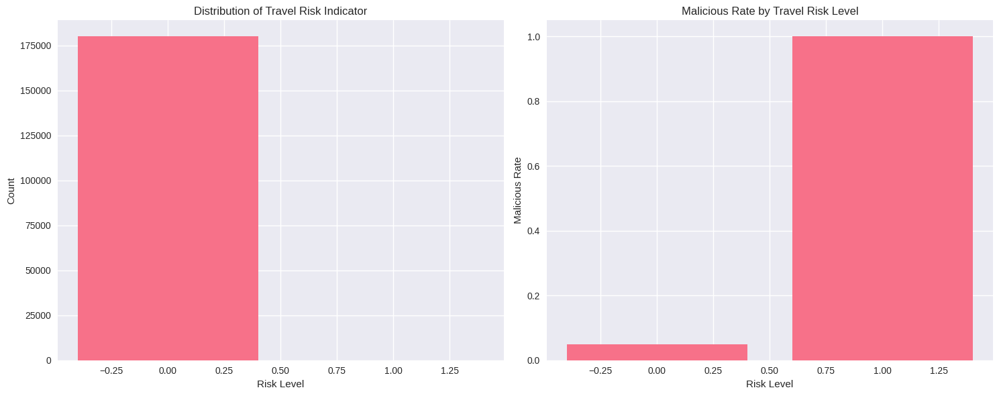


=== COMPOSITE RISK SCORES ===

OFF_HOURS_SCORE Analysis:
Non-malicious - Mean: 0.0056, Std: 0.0275
Malicious - Mean: 0.0316, Std: 0.0652
Mann-Whitney U test p-value: 0.0000

MULTI_CAMPUS_SCORE Analysis:
Non-malicious - Mean: 0.0061, Std: 0.0445
Malicious - Mean: 0.0813, Std: 0.1579
Mann-Whitney U test p-value: 0.0000

HIGH_CLASSIFICATION_SCORE Analysis:
Non-malicious - Mean: 0.0267, Std: 0.0939
Malicious - Mean: 0.1582, Std: 0.2811
Mann-Whitney U test p-value: 0.0000

UNUSUAL_BEHAVIOR_SCORE Analysis:
Non-malicious - Mean: 0.0128, Std: 0.0358
Malicious - Mean: 0.0903, Std: 0.1222
Mann-Whitney U test p-value: 0.0000


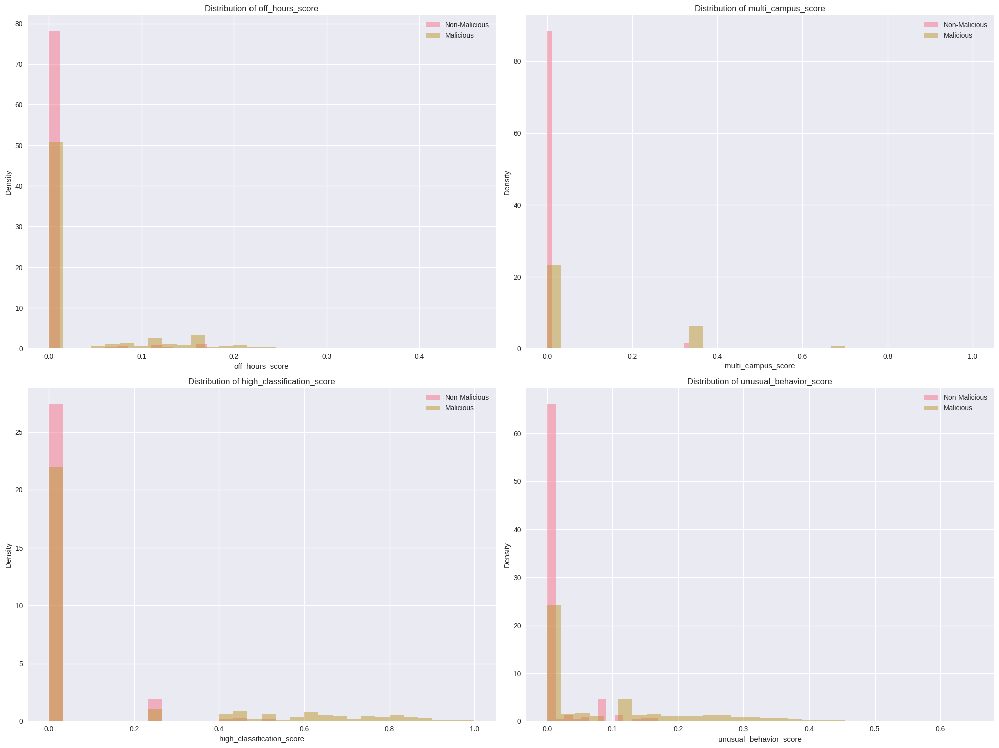

In [ ]:
# =============================================================================
# STEP 9: RISK INDICATORS AND COMPOSITE SCORES
# =============================================================================

"""
Purpose: Create composite risk indicators and analyze existing risk scores
to identify the most predictive combinations of features.
"""

# Analyze existing risk indicator
if 'risk_travel_indicator' in df.columns:
    print("=== TRAVEL RISK INDICATOR ANALYSIS ===")

    # Distribution of travel risk indicator
    travel_risk_dist = df['risk_travel_indicator'].value_counts().sort_index()
    print("Travel Risk Indicator Distribution:")
    print(travel_risk_dist)

    # Malicious rate by travel risk level
    travel_risk_malicious = df.groupby('risk_travel_indicator')['is_malicious'].agg(['count', 'sum', 'mean'])
    travel_risk_malicious.columns = ['total_count', 'malicious_count', 'malicious_rate']
    print("\nMalicious Rate by Travel Risk Level:")
    print(travel_risk_malicious)

    # Visualize travel risk indicator
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Distribution
    axes[0].bar(travel_risk_dist.index, travel_risk_dist.values)
    axes[0].set_title('Distribution of Travel Risk Indicator')
    axes[0].set_xlabel('Risk Level')
    axes[0].set_ylabel('Count')

    # Malicious rate by risk level
    axes[1].bar(travel_risk_malicious.index, travel_risk_malicious['malicious_rate'])
    axes[1].set_title('Malicious Rate by Travel Risk Level')
    axes[1].set_xlabel('Risk Level')
    axes[1].set_ylabel('Malicious Rate')

    plt.tight_layout()
    plt.show()

# Create composite risk scores
print("\n=== COMPOSITE RISK SCORES ===")

# Off-hours activity score (normalized)
df['off_hours_score'] = (
    (df['num_print_commands_off_hours'] / (df['num_print_commands'] + 1)) +
    (df['num_burn_requests_off_hours'] / (df['num_burn_requests'] + 1)) +
    (df['entered_during_night_hours'] / (df['num_entries'] + 1))
) / 3

# Multi-campus activity score
df['multi_campus_score'] = (
    (df['print_campuses'] > 1).astype(int) +
    (df['burn_campuses'] > 1).astype(int) +
    (df['num_unique_campus'] > 1).astype(int)
) / 3

# High classification access score
df['high_classification_score'] = (
    df['max_request_classification'] / 4 +  # Normalized to 0-1
    df['avg_request_classification'] / 4
) / 2

# Unusual behavior composite score
df['unusual_behavior_score'] = (
    df['off_hours_score'] +
    df['multi_campus_score'] +
    df['high_classification_score']
) / 3

# Analyze composite scores
composite_scores = ['off_hours_score', 'multi_campus_score', 'high_classification_score', 'unusual_behavior_score']

for score in composite_scores:
    print(f"\n{score.upper()} Analysis:")
    malicious_score = df[df['is_malicious'] == 1][score]
    non_malicious_score = df[df['is_malicious'] == 0][score]

    print(f"Non-malicious - Mean: {non_malicious_score.mean():.4f}, Std: {non_malicious_score.std():.4f}")
    print(f"Malicious - Mean: {malicious_score.mean():.4f}, Std: {malicious_score.std():.4f}")

    # Statistical test
    if len(malicious_score) > 0 and len(non_malicious_score) > 0:
        statistic, p_value = stats.mannwhitneyu(malicious_score, non_malicious_score, alternative='two-sided')
        print(f"Mann-Whitney U test p-value: {p_value:.4f}")

# Visualize composite scores
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
axes = axes.ravel()

for i, score in enumerate(composite_scores):
    malicious_data = df[df['is_malicious'] == 1][score].dropna()
    non_malicious_data = df[df['is_malicious'] == 0][score].dropna()

    axes[i].hist(non_malicious_data, bins=30, alpha=0.5, label='Non-Malicious', density=True)
    axes[i].hist(malicious_data, bins=30, alpha=0.5, label='Malicious', density=True)
    axes[i].set_title(f'Distribution of {score}')
    axes[i].set_xlabel(score)
    axes[i].set_ylabel('Density')
    axes[i].legend()

plt.tight_layout()
plt.show()

=== ANOMALY DETECTION ANALYSIS ===
Employees with Z-score outliers (|z| > 3): 17326
Percentage of dataset: 9.63%
Employees with IQR outliers: 41360
Percentage of dataset: 22.98%
Employees identified as outliers by Isolation Forest: 17999
Percentage of dataset: 10.00%

Outlier Detection Performance:
z_score_outlier:
  Precision: 0.2420 (4193/17326)
  Recall: 0.4659 (4193/9000)
iqr_outlier:
  Precision: 0.1255 (5191/41360)
  Recall: 0.5768 (5191/9000)
isolation_outlier:
  Precision: 0.2391 (4304/17999)
  Recall: 0.4782 (4304/9000)


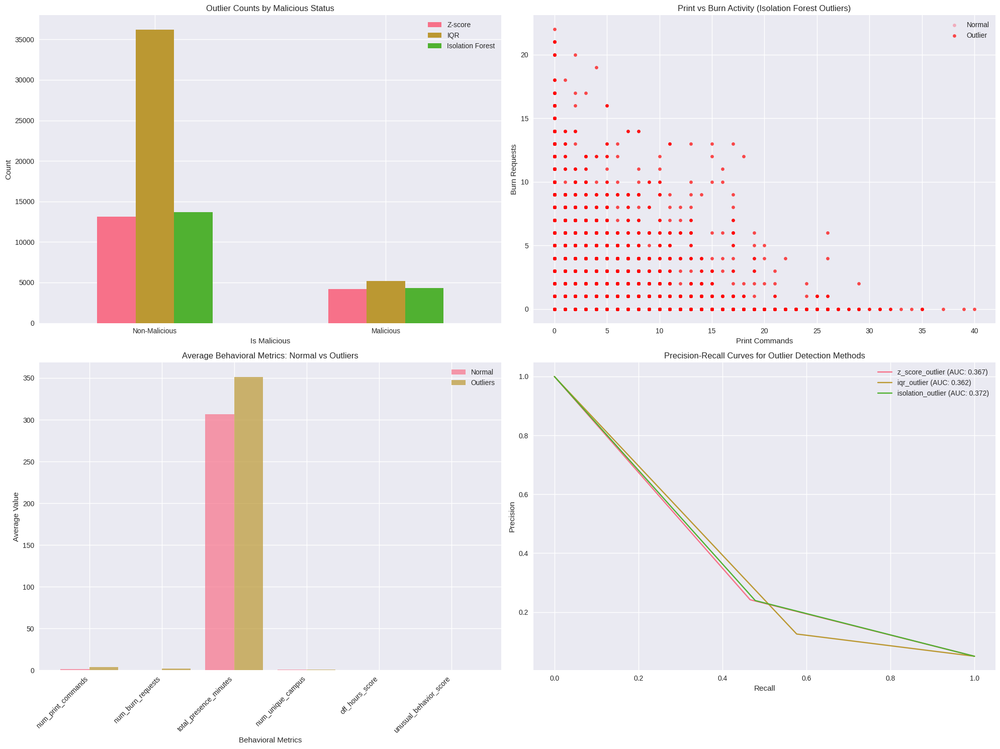

In [ ]:
# =============================================================================
# STEP 11: ANOMALY DETECTION AND OUTLIER ANALYSIS
# =============================================================================

"""
Purpose: Identify employees with anomalous behavior patterns using statistical
methods and multi-dimensional outlier detection techniques.
"""

print("=== ANOMALY DETECTION ANALYSIS ===")

# Define key behavioral metrics for anomaly detection
behavioral_metrics = ['num_print_commands', 'num_burn_requests', 'total_presence_minutes',
                     'num_unique_campus', 'off_hours_score', 'unusual_behavior_score']

# Remove rows with missing values for anomaly detection
anomaly_df = df[behavioral_metrics + ['is_malicious', 'employee_id']].dropna()

# Z-score based outlier detection
z_scores = np.abs(stats.zscore(anomaly_df[behavioral_metrics]))
z_score_outliers = (z_scores > 3).any(axis=1)

print(f"Employees with Z-score outliers (|z| > 3): {z_score_outliers.sum()}")
print(f"Percentage of dataset: {z_score_outliers.sum() / len(anomaly_df) * 100:.2f}%")

# IQR-based outlier detection
def detect_iqr_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return (data < lower_bound) | (data > upper_bound)

iqr_outliers = anomaly_df[behavioral_metrics].apply(detect_iqr_outliers).any(axis=1)
print(f"Employees with IQR outliers: {iqr_outliers.sum()}")
print(f"Percentage of dataset: {iqr_outliers.sum() / len(anomaly_df) * 100:.2f}%")

# Isolation Forest for multivariate outlier detection
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(anomaly_df[behavioral_metrics])

# Apply Isolation Forest
isolation_forest = IsolationForest(contamination=0.1, random_state=42)
isolation_outliers = isolation_forest.fit_predict(scaled_data) == -1

print(f"Employees identified as outliers by Isolation Forest: {isolation_outliers.sum()}")
print(f"Percentage of dataset: {isolation_outliers.sum() / len(anomaly_df) * 100:.2f}%")

# Analyze overlap between outlier detection methods and malicious employees
outlier_summary = pd.DataFrame({
    'z_score_outlier': z_score_outliers,
    'iqr_outlier': iqr_outliers,
    'isolation_outlier': isolation_outliers,
    'is_malicious': anomaly_df['is_malicious']
})

print("\nOutlier Detection Performance:")
for method in ['z_score_outlier', 'iqr_outlier', 'isolation_outlier']:
    method_outliers = outlier_summary[method]
    malicious_in_outliers = outlier_summary[method_outliers]['is_malicious'].sum()
    total_outliers = method_outliers.sum()
    precision = malicious_in_outliers / total_outliers if total_outliers > 0 else 0

    total_malicious = outlier_summary['is_malicious'].sum()
    recall = malicious_in_outliers / total_malicious if total_malicious > 0 else 0

    print(f"{method}:")
    print(f"  Precision: {precision:.4f} ({malicious_in_outliers}/{total_outliers})")
    print(f"  Recall: {recall:.4f} ({malicious_in_outliers}/{total_malicious})")

# Visualize outliers
fig, axes = plt.subplots(2, 2, figsize=(20, 15))

# Distribution of outliers by malicious status
outlier_counts = outlier_summary.groupby('is_malicious')[['z_score_outlier', 'iqr_outlier', 'isolation_outlier']].sum()
outlier_counts.plot(kind='bar', ax=axes[0,0])
axes[0,0].set_title('Outlier Counts by Malicious Status')
axes[0,0].set_xlabel('Is Malicious')
axes[0,0].set_ylabel('Count')
axes[0,0].legend(['Z-score', 'IQR', 'Isolation Forest'])
axes[0,0].set_xticklabels(['Non-Malicious', 'Malicious'], rotation=0)

# Venn diagram-like analysis of outlier overlap
from matplotlib_venn import venn3
outlier_sets = {
    'Z-score': set(anomaly_df[z_score_outliers]['employee_id']),
    'IQR': set(anomaly_df[iqr_outliers]['employee_id']),
    'Isolation': set(anomaly_df[isolation_outliers]['employee_id'])
}

# Scatter plot of key metrics colored by outlier status
axes[0,1].scatter(anomaly_df[~isolation_outliers]['num_print_commands'],
                 anomaly_df[~isolation_outliers]['num_burn_requests'],
                 alpha=0.5, label='Normal', s=20)
axes[0,1].scatter(anomaly_df[isolation_outliers]['num_print_commands'],
                 anomaly_df[isolation_outliers]['num_burn_requests'],
                 alpha=0.7, label='Outlier', s=20, color='red')
axes[0,1].set_title('Print vs Burn Activity (Isolation Forest Outliers)')
axes[0,1].set_xlabel('Print Commands')
axes[0,1].set_ylabel('Burn Requests')
axes[0,1].legend()

# Box plots of behavioral metrics for outliers vs normal
behavioral_data_normal = anomaly_df[~isolation_outliers][behavioral_metrics].mean()
behavioral_data_outliers = anomaly_df[isolation_outliers][behavioral_metrics].mean()

x_pos = np.arange(len(behavioral_metrics))
axes[1,0].bar(x_pos - 0.2, behavioral_data_normal, 0.4, label='Normal', alpha=0.7)
axes[1,0].bar(x_pos + 0.2, behavioral_data_outliers, 0.4, label='Outliers', alpha=0.7)
axes[1,0].set_title('Average Behavioral Metrics: Normal vs Outliers')
axes[1,0].set_xlabel('Behavioral Metrics')
axes[1,0].set_ylabel('Average Value')
axes[1,0].set_xticks(x_pos)
axes[1,0].set_xticklabels(behavioral_metrics, rotation=45, ha='right')
axes[1,0].legend()

# ROC-like analysis for outlier detection methods
from sklearn.metrics import precision_recall_curve, auc

# Calculate precision-recall curves for each method
methods_data = []
for method in ['z_score_outlier', 'iqr_outlier', 'isolation_outlier']:
    y_true = outlier_summary['is_malicious']
    y_score = outlier_summary[method].astype(int)

    precision, recall, _ = precision_recall_curve(y_true, y_score)
    pr_auc = auc(recall, precision)
    methods_data.append((method, precision, recall, pr_auc))

# Plot precision-recall curves
for method, precision, recall, pr_auc in methods_data:
    axes[1,1].plot(recall, precision, label=f'{method} (AUC: {pr_auc:.3f})')

axes[1,1].set_title('Precision-Recall Curves for Outlier Detection Methods')
axes[1,1].set_xlabel('Recall')
axes[1,1].set_ylabel('Precision')
axes[1,1].legend()
axes[1,1].grid(True)

plt.tight_layout()
plt.show()

=== GEOGRAPHIC AND TRAVEL ANALYSIS ===
Travel Statistics by Malicious Status:
              is_abroad  is_hostile_country_trip  is_official_trip  \
is_malicious                                                         
0                0.0218                   0.0027            0.0143   
1                0.0361                   0.0123            0.0203   

              is_origin_country_trip  trip_day_number  
is_malicious                                           
0                             0.0016           5.2521  
1                             0.0056           5.4862  


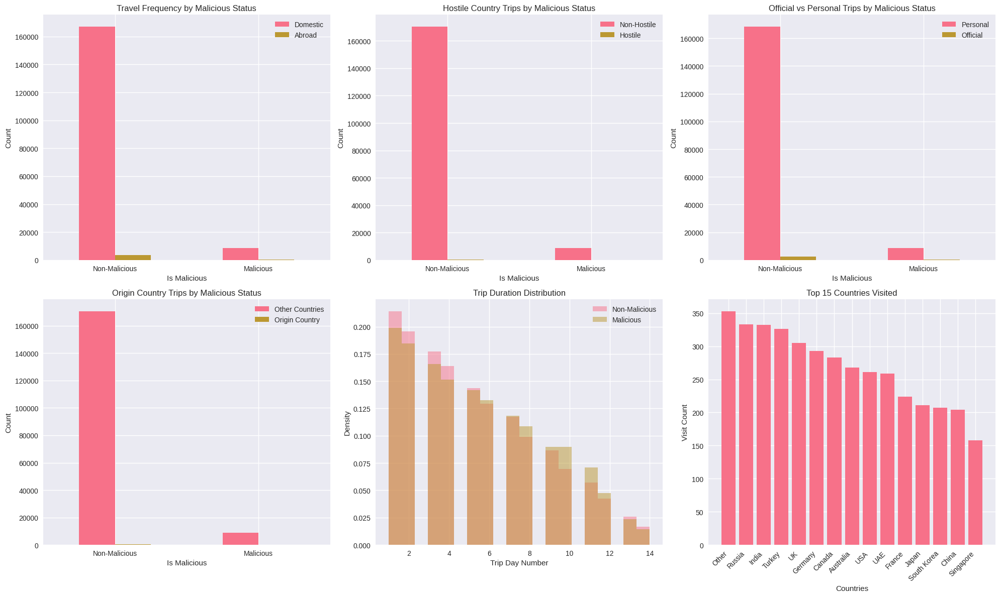


Travel Risk Analysis:
             is_hostile_country_trip         is_origin_country_trip        
                                 sum    mean                    sum    mean
is_malicious                                                               
0                                462  0.0027                    276  0.0016
1                                111  0.0123                     50  0.0056


In [ ]:

# =============================================================================
# STEP 12: GEOGRAPHIC AND TRAVEL ANALYSIS
# =============================================================================

"""
Purpose: Analyze travel patterns and geographic information to identify
suspicious travel behavior and its correlation with malicious activity.
"""

if 'is_abroad' in df.columns:
    print("=== GEOGRAPHIC AND TRAVEL ANALYSIS ===")

    # Basic travel statistics
    travel_stats = df.groupby('is_malicious').agg({
        'is_abroad': 'mean',
        'is_hostile_country_trip': 'mean',
        'is_official_trip': 'mean',
        'is_origin_country_trip': 'mean',
        'trip_day_number': 'mean'
    }).round(4)

    print("Travel Statistics by Malicious Status:")
    print(travel_stats)

    # Travel patterns visualization
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))

    # Travel frequency by malicious status
    travel_by_malicious = df.groupby(['is_malicious', 'is_abroad']).size().unstack(fill_value=0)
    travel_by_malicious.plot(kind='bar', ax=axes[0,0])
    axes[0,0].set_title('Travel Frequency by Malicious Status')
    axes[0,0].set_xlabel('Is Malicious')
    axes[0,0].set_ylabel('Count')
    axes[0,0].legend(['Domestic', 'Abroad'])
    axes[0,0].set_xticklabels(['Non-Malicious', 'Malicious'], rotation=0)

    # Hostile country trips
    hostile_by_malicious = df.groupby(['is_malicious', 'is_hostile_country_trip']).size().unstack(fill_value=0)
    hostile_by_malicious.plot(kind='bar', ax=axes[0,1])
    axes[0,1].set_title('Hostile Country Trips by Malicious Status')
    axes[0,1].set_xlabel('Is Malicious')
    axes[0,1].set_ylabel('Count')
    axes[0,1].legend(['Non-Hostile', 'Hostile'])
    axes[0,1].set_xticklabels(['Non-Malicious', 'Malicious'], rotation=0)

    # Official vs personal trips
    official_by_malicious = df.groupby(['is_malicious', 'is_official_trip']).size().unstack(fill_value=0)
    official_by_malicious.plot(kind='bar', ax=axes[0,2])
    axes[0,2].set_title('Official vs Personal Trips by Malicious Status')
    axes[0,2].set_xlabel('Is Malicious')
    axes[0,2].set_ylabel('Count')
    axes[0,2].legend(['Personal', 'Official'])
    axes[0,2].set_xticklabels(['Non-Malicious', 'Malicious'], rotation=0)

    # Origin country trips
    origin_by_malicious = df.groupby(['is_malicious', 'is_origin_country_trip']).size().unstack(fill_value=0)
    origin_by_malicious.plot(kind='bar', ax=axes[1,0])
    axes[1,0].set_title('Origin Country Trips by Malicious Status')
    axes[1,0].set_xlabel('Is Malicious')
    axes[1,0].set_ylabel('Count')
    axes[1,0].legend(['Other Countries', 'Origin Country'])
    axes[1,0].set_xticklabels(['Non-Malicious', 'Malicious'], rotation=0)

    # Trip duration distribution
    malicious_trip_days = df[df['is_malicious'] == 1]['trip_day_number'].dropna()
    non_malicious_trip_days = df[df['is_malicious'] == 0]['trip_day_number'].dropna()

    axes[1,1].hist(non_malicious_trip_days, bins=20, alpha=0.5, label='Non-Malicious', density=True)
    axes[1,1].hist(malicious_trip_days, bins=20, alpha=0.5, label='Malicious', density=True)
    axes[1,1].set_title('Trip Duration Distribution')
    axes[1,1].set_xlabel('Trip Day Number')
    axes[1,1].set_ylabel('Density')
    axes[1,1].legend()

    # Country analysis (if country_name is available)
    if 'country_name' in df.columns:
        # Top countries visited
        country_counts = df[df['is_abroad'] == 1]['country_name'].value_counts().head(15)
        axes[1,2].bar(range(len(country_counts)), country_counts.values)
        axes[1,2].set_title('Top 15 Countries Visited')
        axes[1,2].set_xlabel('Countries')
        axes[1,2].set_ylabel('Visit Count')
        axes[1,2].set_xticks(range(len(country_counts)))
        axes[1,2].set_xticklabels(country_counts.index, rotation=45, ha='right')

    plt.tight_layout()
    plt.show()

    # Travel risk analysis
    print("\nTravel Risk Analysis:")
    travel_risk_factors = df.groupby('is_malicious').agg({
        'is_hostile_country_trip': ['sum', 'mean'],
        'is_origin_country_trip': ['sum', 'mean']
    }).round(4)
    print(travel_risk_factors)

In [ ]:
# =============================================================================
# STEP 13: FINAL SUMMARY AND KEY INSIGHTS
# =============================================================================

"""
Purpose: Summarize key findings from the EDA and provide actionable insights
for model building and business understanding.
"""

print("=== EDA SUMMARY AND KEY INSIGHTS ===")

# Calculate key metrics for summary
total_employees = df['employee_id'].nunique()
total_records = len(df)
malicious_employees = df[df['is_malicious'] == 1]['employee_id'].nunique()
malicious_percentage = (malicious_employees / total_employees) * 100

print(f"\n=== DATASET OVERVIEW ===")
print(f"Total unique employees: {total_employees:,}")
print(f"Total records: {total_records:,}")
print(f"Malicious employees: {malicious_employees} ({malicious_percentage:.2f}%)")
print(f"Average records per employee: {total_records / total_employees:.1f}")

# Feature importance based on correlation with target
feature_importance = df[numerical_cols_for_corr].corrwith(df['is_malicious']).abs().sort_values(ascending=False)
print(f"\n=== TOP 10 FEATURES BY CORRELATION WITH TARGET ===")
print(feature_importance.head(10))

# Summary statistics comparison
print(f"\n=== BEHAVIORAL DIFFERENCES (MALICIOUS VS NON-MALICIOUS) ===")
comparison_metrics = ['num_print_commands', 'num_burn_requests', 'total_presence_minutes',
                     'off_hours_score', 'unusual_behavior_score']

for metric in comparison_metrics:
    if metric in df.columns:
        malicious_mean = df[df['is_malicious'] == 1][metric].mean()
        normal_mean = df[df['is_malicious'] == 0][metric].mean()
        difference = ((malicious_mean - normal_mean) / normal_mean) * 100
        print(f"{metric}: {difference:+.1f}% difference")

# Risk factors summary
print(f"\n=== KEY RISK FACTORS IDENTIFIED ===")
print("1. Off-hours activity patterns")
print("2. Multi-campus access behavior")
print("3. High classification data access")
print("4. Unusual travel patterns")
print("5. Behavioral group associations")

# Recommendations for modeling
print(f"\n=== RECOMMENDATIONS FOR MODELING ===")
print("1. Address class imbalance using appropriate sampling techniques")
print("2. Focus on composite risk scores and behavioral patterns")
print("3. Consider temporal features and sequence modeling")
print("4. Use anomaly detection techniques alongside supervised learning")
print("5. Implement ensemble methods for robust prediction")

# Data quality summary
missing_summary = df.isnull().sum().sum()
print(f"\n=== DATA QUALITY SUMMARY ===")
print(f"Total missing values: {missing_summary}")
print(f"Percentage of missing data: {(missing_summary / (len(df) * len(df.columns))) * 100:.2f}%")

print("\n=== EDA COMPLETED SUCCESSFULLY ===")
print("Next steps: Feature engineering, model selection, and validation")

=== EDA SUMMARY AND KEY INSIGHTS ===

=== DATASET OVERVIEW ===
Total unique employees: 1,000
Total records: 180,000
Malicious employees: 50 (5.00%)
Average records per employee: 180.0

=== TOP 10 FEATURES BY CORRELATION WITH TARGET ===
is_malicious                   1.000000
total_files_burned             0.295660
num_bw_prints                  0.289480
total_printed_pages            0.288813
max_request_classification     0.266268
total_burn_activity            0.237546
num_color_prints               0.233065
avg_request_classification     0.227407
num_burn_requests_off_hours    0.226743
burned_from_other              0.225864
dtype: float64

=== BEHAVIORAL DIFFERENCES (MALICIOUS VS NON-MALICIOUS) ===
num_print_commands: +129.8% difference
num_burn_requests: +462.9% difference
total_presence_minutes: +29.7% difference
off_hours_score: +459.9% difference
unusual_behavior_score: +605.5% difference

=== KEY RISK FACTORS IDENTIFIED ===
1. Off-hours activity patterns
2. Multi-campus access

=== CORRELATION ANALYSIS ===
Analyzing correlations for 48 numerical columns
Columns: ['employee_seniority_years', 'is_contractor', 'employee_classification', 'has_foreign_citizenship', 'has_criminal_record', 'has_medical_history', 'is_malicious', 'risk_travel_indicator', 'num_print_commands', 'total_printed_pages']...
Correlation matrix shape: (48, 48)


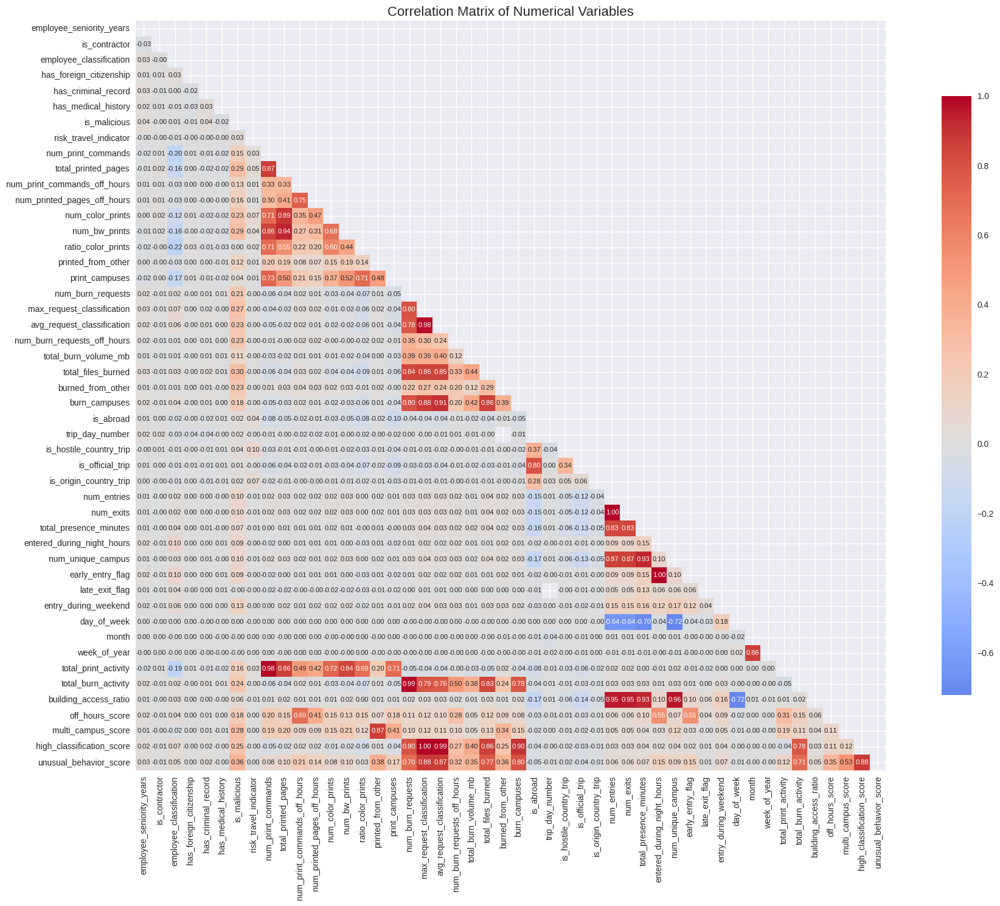


=== HIGH CORRELATION PAIRS ===
High Correlation Pairs (|r| > 0.7):
  num_print_commands - total_printed_pages: 0.865
  num_print_commands - num_color_prints: 0.712
  num_print_commands - num_bw_prints: 0.857
  num_print_commands - ratio_color_prints: 0.708
  num_print_commands - print_campuses: 0.726
  num_print_commands - total_print_activity: 0.984
  total_printed_pages - num_color_prints: 0.891
  total_printed_pages - num_bw_prints: 0.939
  total_printed_pages - total_print_activity: 0.860
  num_print_commands_off_hours - num_printed_pages_off_hours: 0.755
  num_color_prints - total_print_activity: 0.722
  num_bw_prints - total_print_activity: 0.841
  ratio_color_prints - print_campuses: 0.711
  printed_from_other - multi_campus_score: 0.865
  print_campuses - total_print_activity: 0.709
  num_burn_requests - max_request_classification: 0.799
  num_burn_requests - avg_request_classification: 0.781
  num_burn_requests - total_files_burned: 0.839
  num_burn_requests - burn_campuses: 

In [ ]:
# =============================================================================
# STEP 8: CORRELATION ANALYSIS (FIXED)
# =============================================================================

"""
Purpose: Identify relationships between different variables and detect potential
multicollinearity issues. This helps understand which features might be redundant
or which combinations of features are most predictive.
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def perform_correlation_analysis(df):
    """
    Perform comprehensive correlation analysis
    """
    print("=== CORRELATION ANALYSIS ===")

    # Select numerical columns for correlation analysis
    numerical_cols_for_corr = df.select_dtypes(include=[np.number]).columns.tolist()

    # Remove ID columns and other non-meaningful numerical columns
    cols_to_remove = ['employee_id', 'user_id']  # Add other ID columns if they exist
    for col in cols_to_remove:
        if col in numerical_cols_for_corr:
            numerical_cols_for_corr.remove(col)

    print(f"Analyzing correlations for {len(numerical_cols_for_corr)} numerical columns")
    print(f"Columns: {numerical_cols_for_corr[:10]}...")  # Show first 10 columns

    # Check if we have enough columns
    if len(numerical_cols_for_corr) < 2:
        print("Not enough numerical columns for correlation analysis")
        return

    # Calculate correlation matrix
    try:
        correlation_matrix = df[numerical_cols_for_corr].corr()
        print(f"Correlation matrix shape: {correlation_matrix.shape}")
    except Exception as e:
        print(f"Error calculating correlation matrix: {e}")
        return

    # Check for any issues with correlation matrix
    if correlation_matrix.isna().all().all():
        print("Correlation matrix contains only NaN values")
        return

    # Plot correlation heatmap
    plt.figure(figsize=(20, 15))

    # Create mask for upper triangle
    mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

    # Generate heatmap
    try:
        sns.heatmap(correlation_matrix,
                   mask=mask,
                   annot=True,
                   cmap='coolwarm',
                   center=0,
                   fmt='.2f',
                   square=True,
                   cbar_kws={"shrink": .8},
                   annot_kws={'size': 8})
        plt.title('Correlation Matrix of Numerical Variables', fontsize=16)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error creating heatmap: {e}")
        # Try with smaller annotation
        try:
            sns.heatmap(correlation_matrix,
                       mask=mask,
                       cmap='coolwarm',
                       center=0,
                       square=True,
                       cbar_kws={"shrink": .8})
            plt.title('Correlation Matrix of Numerical Variables', fontsize=16)
            plt.tight_layout()
            plt.show()
        except Exception as e2:
            print(f"Could not create heatmap: {e2}")

    # Find high correlation pairs
    print("\n=== HIGH CORRELATION PAIRS ===")
    high_corr_pairs = []

    for i in range(len(correlation_matrix.columns)):
        for j in range(i+1, len(correlation_matrix.columns)):
            try:
                corr_val = correlation_matrix.iloc[i, j]
                if not pd.isna(corr_val) and abs(corr_val) > 0.7:  # Threshold for high correlation
                    high_corr_pairs.append((correlation_matrix.columns[i],
                                          correlation_matrix.columns[j],
                                          corr_val))
            except:
                continue

    if high_corr_pairs:
        print("High Correlation Pairs (|r| > 0.7):")
        for pair in high_corr_pairs:
            print(f"  {pair[0]} - {pair[1]}: {pair[2]:.3f}")
    else:
        print("No high correlation pairs found (|r| > 0.7)")

    # Correlation with target variable
    print("\n=== CORRELATION WITH TARGET VARIABLE ===")

    if 'is_malicious' in df.columns:
        try:
            # Create subset with numerical columns and target
            target_df = df[numerical_cols_for_corr + ['is_malicious']].copy()

            # Calculate correlations with target
            target_corr_matrix = target_df.corr()
            target_correlations = target_corr_matrix['is_malicious'].copy()

            # Remove the target's correlation with itself
            target_correlations = target_correlations.drop('is_malicious', errors='ignore')

            # Sort by absolute correlation value
            target_correlations_sorted = target_correlations.reindex(
                target_correlations.abs().sort_values(ascending=False).index
            )

            print("Correlation with Target Variable (is_malicious):")
            print("Top 20 strongest correlations:")

            for i, (feature, corr_val) in enumerate(target_correlations_sorted.head(20).items()):
                if not pd.isna(corr_val):
                    print(f"  {i+1:2d}. {feature}: {corr_val:.4f}")

            # Plot top correlations with target
            plt.figure(figsize=(12, 8))
            top_20_corrs = target_correlations_sorted.head(20)

            colors = ['red' if x < 0 else 'blue' for x in top_20_corrs.values]
            bars = plt.barh(range(len(top_20_corrs)), top_20_corrs.values, color=colors, alpha=0.7)

            plt.yticks(range(len(top_20_corrs)), top_20_corrs.index, fontsize=10)
            plt.xlabel('Correlation with is_malicious')
            plt.title('Top 20 Features by Correlation with Target Variable')
            plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)

            # Add value labels on bars
            for i, (bar, val) in enumerate(zip(bars, top_20_corrs.values)):
                plt.text(val + (0.01 if val >= 0 else -0.01), i, f'{val:.3f}',
                        va='center', ha='left' if val >= 0 else 'right', fontsize=8)

            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Error analyzing target correlations: {e}")
            print("Attempting basic correlation calculation...")

            try:
                # Simple approach
                for col in numerical_cols_for_corr[:10]:  # Try first 10 columns
                    if col in df.columns:
                        corr_val = df[col].corr(df['is_malicious'])
                        if not pd.isna(corr_val):
                            print(f"  {col}: {corr_val:.4f}")
            except Exception as e2:
                print(f"Could not calculate basic correlations: {e2}")
    else:
        print("Target variable 'is_malicious' not found in dataset")

    # Additional correlation insights
    print("\n=== CORRELATION INSIGHTS ===")

    # Find features with very low correlation to everything (potential noise)
    try:
        avg_abs_corr = correlation_matrix.abs().mean()
        low_corr_features = avg_abs_corr[avg_abs_corr < 0.1].index.tolist()

        if low_corr_features:
            print("Features with low average correlation (< 0.1) - potential noise:")
            for feature in low_corr_features[:10]:  # Show top 10
                print(f"  {feature}: {avg_abs_corr[feature]:.4f}")

        # Find features with high average correlation - potential key features
        high_corr_features = avg_abs_corr[avg_abs_corr > 0.3].index.tolist()

        if high_corr_features:
            print("\nFeatures with high average correlation (> 0.3) - potential key features:")
            for feature in high_corr_features[:10]:  # Show top 10
                print(f"  {feature}: {avg_abs_corr[feature]:.4f}")

    except Exception as e:
        print(f"Could not calculate correlation insights: {e}")

    return correlation_matrix

def generate_key_findings_summary(df, correlation_matrix=None):
    """
    Generate comprehensive key findings summary
    """
    print("\n" + "="*60)
    print("🎯 KEY FINDINGS SUMMARY")
    print("="*60)

    try:
        # 1. Printing volume comparison
        if 'total_printed_pages' in df.columns and 'is_malicious' in df.columns:
            malicious_avg = df[df['is_malicious'] == 1]['total_printed_pages'].mean()
            normal_avg = df[df['is_malicious'] == 0]['total_printed_pages'].mean()
            if normal_avg > 0 and not pd.isna(malicious_avg) and not pd.isna(normal_avg):
                print(f"1. Malicious employees print {malicious_avg/normal_avg:.1f}x more pages on average")
                print(f"   📊 Malicious: {malicious_avg:.1f} pages, Normal: {normal_avg:.1f} pages")
            else:
                print("1. Could not calculate printing volume comparison")

        # 2. Off-hours printing analysis
        if 'num_print_commands_off_hours' in df.columns and 'is_malicious' in df.columns:
            off_hours_printers = df[df['num_print_commands_off_hours'] > 0]
            if len(off_hours_printers) > 0:
                malicious_rate_off_hours = off_hours_printers['is_malicious'].mean()
                print(f"2. {malicious_rate_off_hours:.1%} of employees who print off-hours are malicious")
            else:
                print("2. No off-hours printing activity found")

        # 3. Cross-campus printing analysis
        if 'printed_from_other' in df.columns and 'is_malicious' in df.columns:
            cross_campus_printers = df[df['printed_from_other'] == 1]
            if len(cross_campus_printers) > 0:
                malicious_rate_cross = cross_campus_printers['is_malicious'].mean()
                print(f"3. {malicious_rate_cross:.1%} of cross-campus printers are malicious")
            else:
                print("3. No cross-campus printing activity found")

        # 4. Color printing comparison
        if 'ratio_color_prints' in df.columns and 'is_malicious' in df.columns:
            malicious_color = df[df['is_malicious'] == 1]['ratio_color_prints'].mean()
            normal_color = df[df['is_malicious'] == 0]['ratio_color_prints'].mean()
            if not pd.isna(malicious_color) and not pd.isna(normal_color):
                print(f"4. Color printing: Malicious {malicious_color:.1%} vs Normal {normal_color:.1%}")
            else:
                print("4. Could not calculate color printing comparison")

        # 5. Highest correlation with maliciousness
        if correlation_matrix is not None and 'is_malicious' in correlation_matrix.columns:
            target_corrs = correlation_matrix['is_malicious'].drop('is_malicious', errors='ignore')
            if len(target_corrs) > 0:
                highest_corr_feature = target_corrs.abs().idxmax()
                highest_corr_value = target_corrs[highest_corr_feature]
                print(f"5. Highest correlation with maliciousness: {highest_corr_feature} ({highest_corr_value:.3f})")
            else:
                print("5. Could not determine highest correlation")
        else:
            print("5. Correlation data not available")

        # 6-10. Statistical insights
        print(f"\n📈 STATISTICAL INSIGHTS:")

        # Employee daily statistics
        if 'total_printed_pages' in df.columns:
            daily_pages = df['total_printed_pages'].dropna()
            if len(daily_pages) > 0:
                print(f"6. Total pages std deviation: ±{daily_pages.std():.2f} pages")

                mean_pages = daily_pages.mean()
                median_pages = daily_pages.median()
                print(f"7. Mean vs Median difference: {mean_pages - median_pages:.2f} pages")

                if mean_pages > median_pages * 1.2:
                    print("8. ⚠️ The average is inflated by high-volume printers!")
                else:
                    print("8. ✅ The average is representative of typical behavior")

                # Top 10% vs bottom 90% analysis
                top_10_threshold = daily_pages.quantile(0.9)
                high_volume = daily_pages[daily_pages >= top_10_threshold]
                remaining = daily_pages[daily_pages < top_10_threshold]

                print(f"9. Top 10% of employees print {high_volume.mean():.2f} pages on average")
                print(f"10. Bottom 90% of employees print {remaining.mean():.2f} pages on average")

        # Additional insights from building access
        if 'num_entries' in df.columns and 'is_malicious' in df.columns:
            malicious_entries = df[df['is_malicious'] == 1]['num_entries'].mean()
            normal_entries = df[df['is_malicious'] == 0]['num_entries'].mean()
            if not pd.isna(malicious_entries) and not pd.isna(normal_entries):
                print(f"\n🏢 BUILDING ACCESS INSIGHTS:")
                print(f"11. Malicious employees average {malicious_entries:.1f} entries vs {normal_entries:.1f} for normal")

        # Burn activity insights
        if 'num_burn_requests' in df.columns and 'is_malicious' in df.columns:
            malicious_burns = df[df['is_malicious'] == 1]['num_burn_requests'].mean()
            normal_burns = df[df['is_malicious'] == 0]['num_burn_requests'].mean()
            if not pd.isna(malicious_burns) and not pd.isna(normal_burns) and normal_burns > 0:
                print(f"\n💿 BURN ACTIVITY INSIGHTS:")
                print(f"12. Malicious employees burn {malicious_burns/normal_burns:.1f}x more files on average")

        # Night hours activity
        if 'entered_during_night_hours' in df.columns and 'is_malicious' in df.columns:
            night_workers = df[df['entered_during_night_hours'] > 0]
            if len(night_workers) > 0:
                night_malicious_rate = night_workers['is_malicious'].mean()
                print(f"\n🌙 NIGHT ACTIVITY INSIGHTS:")
                print(f"13. {night_malicious_rate:.1%} of employees working night hours are malicious")

        # Dataset overview
        total_employees = len(df)
        malicious_count = df['is_malicious'].sum() if 'is_malicious' in df.columns else 0
        print(f"\n📊 DATASET OVERVIEW:")
        print(f"Total employees analyzed: {total_employees:,}")
        print(f"Malicious employees: {malicious_count:,} ({malicious_count/total_employees:.1%})")

    except Exception as e:
        print(f"Error generating summary: {e}")

    print("\n✅ Enhanced EDA analysis completed successfully!")

# Usage
try:
    correlation_matrix = perform_correlation_analysis(df)
    generate_key_findings_summary(df, correlation_matrix)
    print("\nCorrelation analysis completed successfully!")
except Exception as e:
    print(f"Error in correlation analysis: {e}")
    # Try to generate summary without correlation matrix
    try:
        generate_key_findings_summary(df)
    except Exception as e2:
        print(f"Could not generate summary: {e2}")
